This is a personal project, encompassing data from my Fantasy Football (NFL) league. This project is a work in progress, as I continue to seek insights and attempt to project future success in this game.

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [44]:
team_data = pd.read_csv(r"C:\Users\omrig\Downloads\Fantasy Football Data\team_data (1).csv")

In [45]:
team_data

,Unnamed: 0,week,team_id,team_name,owner,real_score,proj_score,positions,scores,espn_score,year,lid,vorps,coaching_points
0,0,13,6,The Nasni degoniats,Asaf Liveanu,94.72,114.30,"{RB,WR,RB2,TE,QB,D/ST,WR2,K,RB/WR/TE}","{13.7,7.3,2.0,2.0,28.12,9.0,16.5,8.0,8.1}",85.32,2019,747609,"{10.7,-4.2,-1.0,-5.4,0.0,5.0,5.0}",NaN
1,1,1,6,The Nasni degoniats,Asaf Liveanu,117.74,104.79,"{RB,WR,RB2,RB/WR/TE,WR2,TE,D/ST,K,QB}","{37.9,3.8,15.5,1.4,24.7,8.0,0.0,16.0,10.44}",117.44,2019,747609,"{32.6,-6.500000000000001,10.2,14.3999999999999...",NaN
2,2,1,4,Team Assafuckers,Barak Perelman,110.70,106.80,"{WR,RB,WR2,TE,RB2,RB/WR/TE,QB,K,D/ST}","{27.1,8.5,11.8,7.9,10.7,10.3,9.4,11.0,14.0}",86.40,2019,747609,"{16.8,3.2,1.5,-12.1,5.3999999999999995,-16.240...",NaN
3,3,1,7,The Four Horsemen,Barak Mayzel,109.46,103.91,"{RB,WR,RB/WR/TE,RB2,WR2,TE,QB,K,D/ST}","{20.2,17.3,2.6,5.0,10.9,23.1,5.36,17.0,8.0}",124.66,2019,747609,"{14.899999999999999,7.0,-0.2999999999999998,0....",NaN
4,4,1,9,Team Wentzylvania,Omri Arens,84.12,107.40,"{WR,WR2,RB,RB2,RB/WR/TE,TE,QB,D/ST,K}","{12.1,10.8,9.4,4.4,12.2,3.2,25.02,1.0,6.0}",70.92,2019,747609,"{1.799999999999999,0.5,4.1000000000000005,-0.8...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
607,607,16,10,Blaugrana Vigilantes,Dany Naigeboren,113.90,116.14,"{WR,RB,RB2,RB/WR/TE,WR2,QB,K,D/ST,TE}","{25.3,4.4,10.7,9.6,11.6,25.5,8.5,7.0,11.3}",94.20,2022,747609,"{20.9,1.4000000000000004,7.699999999999999,7.1...",NaN
608,608,16,1,Twin Peaks Julians,Doron Gill,107.22,94.80,"{WR,TE,D/ST,WR2,RB,RB2,QB,RB/WR/TE,K}","{29.0,6.0,-4.0,3.0,11.8,5.9,13.82,33.7,8.0}",99.42,2022,747609,"{24.6,-1.7999999999999998,-1.4000000000000004,...",NaN
609,609,16,7,TFH: A New Hope,Barak Mayzel,78.56,108.64,"{WR,RB,RB/WR/TE,WR2,RB2,D/ST,TE,QB,K}","{9.9,3.0,8.4,13.3,2.3,11.0,5.8,10.86,14.0}",66.40,2022,747609,"{5.5,0.0,8.9,-0.7000000000000002,-2.0,-10.4000...",NaN
610,610,16,9,F*ing Catalina Wine Mixon,Omri Arens,121.30,101.41,"{TE,WR,RB/WR/TE,D/ST,RB,WR2,RB2,QB,K}","{14.3,17.6,5.6,8.0,9.5,27.3,11.3,23.7,4.0}",94.44,2022,747609,"{6.500000000000001,13.200000000000001,6.5,22.9...",NaN


In [46]:
team_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 612 entries, 0 to 611
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       612 non-null    int64  
 1   week             612 non-null    int64  
 2   team_id          612 non-null    int64  
 3   team_name        612 non-null    object 
 4   owner            612 non-null    object 
 5   real_score       612 non-null    float64
 6   proj_score       612 non-null    float64
 7   positions        612 non-null    object 
 8   scores           612 non-null    object 
 9   espn_score       612 non-null    float64
 10  year             612 non-null    int64  
 11  lid              612 non-null    int64  
 12  vorps            612 non-null    object 
 13  coaching_points  0 non-null      float64
dtypes: float64(4), int64(5), object(5)
memory usage: 67.1+ KB


In [47]:
team_data = team_data.drop('positions', axis='columns')
team_data = team_data.drop('coaching_points', axis='columns')
team_data = team_data.drop('lid', axis='columns')
team_data = team_data.drop('team_name', axis='columns')

team_data

,Unnamed: 0,week,team_id,owner,real_score,proj_score,scores,espn_score,year,vorps
0,0,13,6,Asaf Liveanu,94.72,114.30,"{13.7,7.3,2.0,2.0,28.12,9.0,16.5,8.0,8.1}",85.32,2019,"{10.7,-4.2,-1.0,-5.4,0.0,5.0,5.0}"
1,1,1,6,Asaf Liveanu,117.74,104.79,"{37.9,3.8,15.5,1.4,24.7,8.0,0.0,16.0,10.44}",117.44,2019,"{32.6,-6.500000000000001,10.2,14.3999999999999..."
2,2,1,4,Barak Perelman,110.70,106.80,"{27.1,8.5,11.8,7.9,10.7,10.3,9.4,11.0,14.0}",86.40,2019,"{16.8,3.2,1.5,-12.1,5.3999999999999995,-16.240..."
3,3,1,7,Barak Mayzel,109.46,103.91,"{20.2,17.3,2.6,5.0,10.9,23.1,5.36,17.0,8.0}",124.66,2019,"{14.899999999999999,7.0,-0.2999999999999998,0...."
4,4,1,9,Omri Arens,84.12,107.40,"{12.1,10.8,9.4,4.4,12.2,3.2,25.02,1.0,6.0}",70.92,2019,"{1.799999999999999,0.5,4.1000000000000005,-0.8..."
...,...,...,...,...,...,...,...,...,...,...
607,607,16,10,Dany Naigeboren,113.90,116.14,"{25.3,4.4,10.7,9.6,11.6,25.5,8.5,7.0,11.3}",94.20,2022,"{20.9,1.4000000000000004,7.699999999999999,7.1..."
608,608,16,1,Doron Gill,107.22,94.80,"{29.0,6.0,-4.0,3.0,11.8,5.9,13.82,33.7,8.0}",99.42,2022,"{24.6,-1.7999999999999998,-1.4000000000000004,..."
609,609,16,7,Barak Mayzel,78.56,108.64,"{9.9,3.0,8.4,13.3,2.3,11.0,5.8,10.86,14.0}",66.40,2022,"{5.5,0.0,8.9,-0.7000000000000002,-2.0,-10.4000..."
610,610,16,9,Omri Arens,121.30,101.41,"{14.3,17.6,5.6,8.0,9.5,27.3,11.3,23.7,4.0}",94.44,2022,"{6.500000000000001,13.200000000000001,6.5,22.9..."


In [48]:
team_data['real_vs_proj_diff'] = team_data['real_score'] - team_data['proj_score']
team_data

,Unnamed: 0,week,team_id,owner,real_score,proj_score,scores,espn_score,year,vorps,real_vs_proj_diff
0,0,13,6,Asaf Liveanu,94.72,114.30,"{13.7,7.3,2.0,2.0,28.12,9.0,16.5,8.0,8.1}",85.32,2019,"{10.7,-4.2,-1.0,-5.4,0.0,5.0,5.0}",-19.58
1,1,1,6,Asaf Liveanu,117.74,104.79,"{37.9,3.8,15.5,1.4,24.7,8.0,0.0,16.0,10.44}",117.44,2019,"{32.6,-6.500000000000001,10.2,14.3999999999999...",12.95
2,2,1,4,Barak Perelman,110.70,106.80,"{27.1,8.5,11.8,7.9,10.7,10.3,9.4,11.0,14.0}",86.40,2019,"{16.8,3.2,1.5,-12.1,5.3999999999999995,-16.240...",3.90
3,3,1,7,Barak Mayzel,109.46,103.91,"{20.2,17.3,2.6,5.0,10.9,23.1,5.36,17.0,8.0}",124.66,2019,"{14.899999999999999,7.0,-0.2999999999999998,0....",5.55
4,4,1,9,Omri Arens,84.12,107.40,"{12.1,10.8,9.4,4.4,12.2,3.2,25.02,1.0,6.0}",70.92,2019,"{1.799999999999999,0.5,4.1000000000000005,-0.8...",-23.28
...,...,...,...,...,...,...,...,...,...,...,...
607,607,16,10,Dany Naigeboren,113.90,116.14,"{25.3,4.4,10.7,9.6,11.6,25.5,8.5,7.0,11.3}",94.20,2022,"{20.9,1.4000000000000004,7.699999999999999,7.1...",-2.24
608,608,16,1,Doron Gill,107.22,94.80,"{29.0,6.0,-4.0,3.0,11.8,5.9,13.82,33.7,8.0}",99.42,2022,"{24.6,-1.7999999999999998,-1.4000000000000004,...",12.42
609,609,16,7,Barak Mayzel,78.56,108.64,"{9.9,3.0,8.4,13.3,2.3,11.0,5.8,10.86,14.0}",66.40,2022,"{5.5,0.0,8.9,-0.7000000000000002,-2.0,-10.4000...",-30.08
610,610,16,9,Omri Arens,121.30,101.41,"{14.3,17.6,5.6,8.0,9.5,27.3,11.3,23.7,4.0}",94.44,2022,"{6.500000000000001,13.200000000000001,6.5,22.9...",19.89


In [49]:
team_data['owner'].value_counts()

Omri Gill          62
Aviv Kay           62
Idan Cohen         62
Dany Naigeboren    62
Asaf Liveanu       61
Barak Perelman     61
Barak Mayzel       61
Omri Arens         61
Doron Gill         61
Shai Berenson      31
shai berenson      28
Name: owner, dtype: int64

In [51]:
team_data['owner'].replace('shai berenson', 'Shai Berenson', inplace=True)

In [52]:
team_data['owner'].value_counts()

Omri Gill          62
Aviv Kay           62
Idan Cohen         62
Dany Naigeboren    62
Asaf Liveanu       61
Barak Perelman     61
Barak Mayzel       61
Omri Arens         61
Doron Gill         61
Shai Berenson      59
Name: owner, dtype: int64

In [53]:
year_data = team_data.groupby('year')
year_data

In [54]:
team_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 612 entries, 0 to 611
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         612 non-null    int64  
 1   week               612 non-null    int64  
 2   team_id            612 non-null    int64  
 3   owner              612 non-null    object 
 4   real_score         612 non-null    float64
 5   proj_score         612 non-null    float64
 6   scores             612 non-null    object 
 7   espn_score         612 non-null    float64
 8   year               612 non-null    int64  
 9   vorps              612 non-null    object 
 10  real_vs_proj_diff  612 non-null    float64
dtypes: float64(4), int64(4), object(3)
memory usage: 52.7+ KB


In [55]:
owner_year_grouped = team_data.groupby(['owner', 'year'])

In [56]:
for (owner, year), group_data in owner_year_grouped:
    print(f"Owner: {owner}, Year: {year}")
    print(group_data)


Owner: Asaf Liveanu, Year: 2019
     Unnamed: 0  week  team_id         owner  real_score  proj_score  \
0             0    13        6  Asaf Liveanu       94.72      114.30   
1             1     1        6  Asaf Liveanu      117.74      104.79   
14           14     2        6  Asaf Liveanu       80.46      111.13   
27           27     3        6  Asaf Liveanu      153.94      108.46   
37           37     4        6  Asaf Liveanu       85.30       98.52   
44           44     5        6  Asaf Liveanu      143.82      116.07   
60           60     6        6  Asaf Liveanu       87.72      112.09   
67           67     7        6  Asaf Liveanu       95.56       98.65   
76           76     8        6  Asaf Liveanu      155.20      110.98   
83           83     9        6  Asaf Liveanu      129.64      123.62   
91           91    10        6  Asaf Liveanu      109.62      128.86   
103         103    11        6  Asaf Liveanu       98.92      118.33   
118         118    12        6  

In [57]:
for (owner, year), group_data in owner_year_grouped:
    print(f"Owner: {owner}, Year: {year}")
    
    highest_diff = group_data['real_vs_proj_diff'].max()
    lowest_diff = group_data['real_vs_proj_diff'].min()
    
    print(f"Highest Diff: {highest_diff}, Lowest Diff: {lowest_diff}")

Owner: Asaf Liveanu, Year: 2019
Highest Diff: 45.480000000000004, Lowest Diff: -34.50000000000003
Owner: Asaf Liveanu, Year: 2020
Highest Diff: 56.28999999999999, Lowest Diff: -27.139999999999986
Owner: Asaf Liveanu, Year: 2021
Highest Diff: 40.48000000000003, Lowest Diff: -39.74000000000002
Owner: Asaf Liveanu, Year: 2022
Highest Diff: 37.489999999999995, Lowest Diff: -32.219999999999985
Owner: Aviv Kay, Year: 2019
Highest Diff: 67.62, Lowest Diff: -30.60000000000001
Owner: Aviv Kay, Year: 2020
Highest Diff: 39.900000000000006, Lowest Diff: -16.53
Owner: Aviv Kay, Year: 2021
Highest Diff: 32.81999999999999, Lowest Diff: -40.75999999999999
Owner: Aviv Kay, Year: 2022
Highest Diff: 43.56, Lowest Diff: -46.51999999999998
Owner: Barak Mayzel, Year: 2019
Highest Diff: 45.01999999999998, Lowest Diff: -21.319999999999993
Owner: Barak Mayzel, Year: 2020
Highest Diff: 34.31999999999999, Lowest Diff: -40.949999999999974
Owner: Barak Mayzel, Year: 2021
Highest Diff: 32.379999999999995, Lowest Di

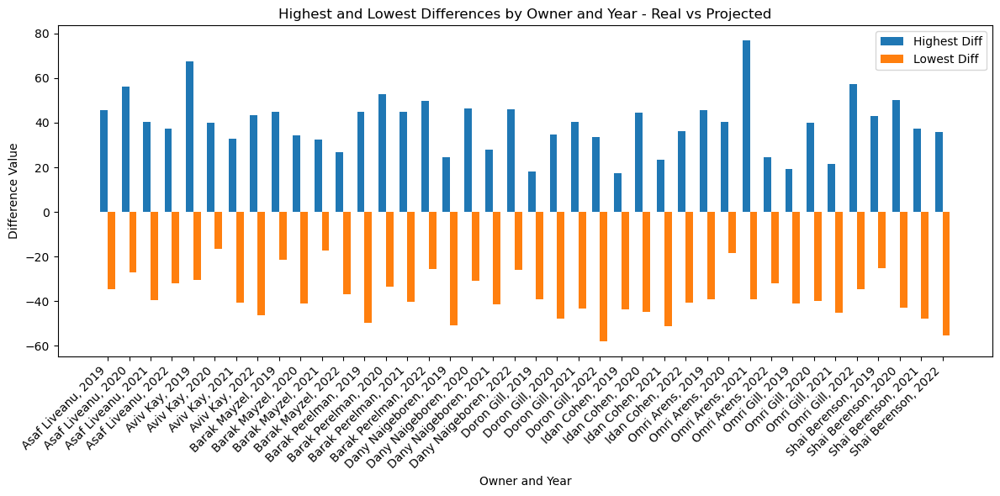

In [58]:
owners = []
years = []
highest_diffs = []
lowest_diffs = []

for (owner, year), group_data in owner_year_grouped:
    owners.append(owner)
    years.append(year)

    highest_diff = group_data['real_vs_proj_diff'].max()
    lowest_diff = group_data['real_vs_proj_diff'].min()
    
    highest_diffs.append(highest_diff)
    lowest_diffs.append(lowest_diff)

fig, ax = plt.subplots(figsize=(12, 6))
bar_width = 0.35

index = np.arange(len(owners))

bar1 = ax.bar(index, highest_diffs, bar_width, label='Highest Diff')
bar2 = ax.bar(index + bar_width, lowest_diffs, bar_width, label='Lowest Diff')

ax.set_xlabel('Owner and Year')
ax.set_ylabel('Difference Value')
ax.set_title('Highest and Lowest Differences by Owner and Year - Real vs Projected')

ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels([f'{owners[i]}, {years[i]}' for i in range(len(owners))], rotation=45, ha='right')
#ax.set_xticklabels([f'{owner}, {year}' for owner, year in zip(owners, years)], rotation=45, ha='right')
ax.legend()

plt.tight_layout()
plt.show()

In [59]:
team_data

,Unnamed: 0,week,team_id,owner,real_score,proj_score,scores,espn_score,year,vorps,real_vs_proj_diff
0,0,13,6,Asaf Liveanu,94.72,114.30,"{13.7,7.3,2.0,2.0,28.12,9.0,16.5,8.0,8.1}",85.32,2019,"{10.7,-4.2,-1.0,-5.4,0.0,5.0,5.0}",-19.58
1,1,1,6,Asaf Liveanu,117.74,104.79,"{37.9,3.8,15.5,1.4,24.7,8.0,0.0,16.0,10.44}",117.44,2019,"{32.6,-6.500000000000001,10.2,14.3999999999999...",12.95
2,2,1,4,Barak Perelman,110.70,106.80,"{27.1,8.5,11.8,7.9,10.7,10.3,9.4,11.0,14.0}",86.40,2019,"{16.8,3.2,1.5,-12.1,5.3999999999999995,-16.240...",3.90
3,3,1,7,Barak Mayzel,109.46,103.91,"{20.2,17.3,2.6,5.0,10.9,23.1,5.36,17.0,8.0}",124.66,2019,"{14.899999999999999,7.0,-0.2999999999999998,0....",5.55
4,4,1,9,Omri Arens,84.12,107.40,"{12.1,10.8,9.4,4.4,12.2,3.2,25.02,1.0,6.0}",70.92,2019,"{1.799999999999999,0.5,4.1000000000000005,-0.8...",-23.28
...,...,...,...,...,...,...,...,...,...,...,...
607,607,16,10,Dany Naigeboren,113.90,116.14,"{25.3,4.4,10.7,9.6,11.6,25.5,8.5,7.0,11.3}",94.20,2022,"{20.9,1.4000000000000004,7.699999999999999,7.1...",-2.24
608,608,16,1,Doron Gill,107.22,94.80,"{29.0,6.0,-4.0,3.0,11.8,5.9,13.82,33.7,8.0}",99.42,2022,"{24.6,-1.7999999999999998,-1.4000000000000004,...",12.42
609,609,16,7,Barak Mayzel,78.56,108.64,"{9.9,3.0,8.4,13.3,2.3,11.0,5.8,10.86,14.0}",66.40,2022,"{5.5,0.0,8.9,-0.7000000000000002,-2.0,-10.4000...",-30.08
610,610,16,9,Omri Arens,121.30,101.41,"{14.3,17.6,5.6,8.0,9.5,27.3,11.3,23.7,4.0}",94.44,2022,"{6.500000000000001,13.200000000000001,6.5,22.9...",19.89


In [60]:
team_data['proj_vs_espn_diff'] = team_data['proj_score'] - team_data['espn_score']
team_data['real_vs_espn_diff'] = team_data['real_score'] - team_data['espn_score']
team_data

,Unnamed: 0,week,team_id,owner,real_score,proj_score,scores,espn_score,year,vorps,real_vs_proj_diff,proj_vs_espn_diff,real_vs_espn_diff
0,0,13,6,Asaf Liveanu,94.72,114.30,"{13.7,7.3,2.0,2.0,28.12,9.0,16.5,8.0,8.1}",85.32,2019,"{10.7,-4.2,-1.0,-5.4,0.0,5.0,5.0}",-19.58,28.98,9.40
1,1,1,6,Asaf Liveanu,117.74,104.79,"{37.9,3.8,15.5,1.4,24.7,8.0,0.0,16.0,10.44}",117.44,2019,"{32.6,-6.500000000000001,10.2,14.3999999999999...",12.95,-12.65,0.30
2,2,1,4,Barak Perelman,110.70,106.80,"{27.1,8.5,11.8,7.9,10.7,10.3,9.4,11.0,14.0}",86.40,2019,"{16.8,3.2,1.5,-12.1,5.3999999999999995,-16.240...",3.90,20.40,24.30
3,3,1,7,Barak Mayzel,109.46,103.91,"{20.2,17.3,2.6,5.0,10.9,23.1,5.36,17.0,8.0}",124.66,2019,"{14.899999999999999,7.0,-0.2999999999999998,0....",5.55,-20.75,-15.20
4,4,1,9,Omri Arens,84.12,107.40,"{12.1,10.8,9.4,4.4,12.2,3.2,25.02,1.0,6.0}",70.92,2019,"{1.799999999999999,0.5,4.1000000000000005,-0.8...",-23.28,36.48,13.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...
607,607,16,10,Dany Naigeboren,113.90,116.14,"{25.3,4.4,10.7,9.6,11.6,25.5,8.5,7.0,11.3}",94.20,2022,"{20.9,1.4000000000000004,7.699999999999999,7.1...",-2.24,21.94,19.70
608,608,16,1,Doron Gill,107.22,94.80,"{29.0,6.0,-4.0,3.0,11.8,5.9,13.82,33.7,8.0}",99.42,2022,"{24.6,-1.7999999999999998,-1.4000000000000004,...",12.42,-4.62,7.80
609,609,16,7,Barak Mayzel,78.56,108.64,"{9.9,3.0,8.4,13.3,2.3,11.0,5.8,10.86,14.0}",66.40,2022,"{5.5,0.0,8.9,-0.7000000000000002,-2.0,-10.4000...",-30.08,42.24,12.16
610,610,16,9,Omri Arens,121.30,101.41,"{14.3,17.6,5.6,8.0,9.5,27.3,11.3,23.7,4.0}",94.44,2022,"{6.500000000000001,13.200000000000001,6.5,22.9...",19.89,6.97,26.86


In [61]:
for (owner, year), group_data in owner_year_grouped:
    print(f"Owner: {owner}, Year: {year}")
    
    highest_diff = group_data['proj_vs_espn_diff'].max()
    lowest_diff = group_data['proj_vs_espn_diff'].min()
    
    print(f"Highest Diff: {highest_diff}, Lowest Diff: {lowest_diff}")

Owner: Asaf Liveanu, Year: 2019
Highest Diff: 49.969999999999985, Lowest Diff: -36.819999999999965
Owner: Asaf Liveanu, Year: 2020
Highest Diff: 64.93999999999998, Lowest Diff: -15.149999999999991
Owner: Asaf Liveanu, Year: 2021
Highest Diff: 52.86, Lowest Diff: -7.259999999999991
Owner: Asaf Liveanu, Year: 2022
Highest Diff: 50.91999999999999, Lowest Diff: -15.620000000000019
Owner: Aviv Kay, Year: 2019
Highest Diff: 54.92, Lowest Diff: -28.80000000000001
Owner: Aviv Kay, Year: 2020
Highest Diff: 56.15999999999999, Lowest Diff: 9.799999999999997
Owner: Aviv Kay, Year: 2021
Highest Diff: 53.959999999999994, Lowest Diff: -4.689999999999998
Owner: Aviv Kay, Year: 2022
Highest Diff: 58.719999999999985, Lowest Diff: -23.659999999999997
Owner: Barak Mayzel, Year: 2019
Highest Diff: 42.05999999999999, Lowest Diff: -32.84999999999998
Owner: Barak Mayzel, Year: 2020
Highest Diff: 77.31, Lowest Diff: 0.37999999999999545
Owner: Barak Mayzel, Year: 2021
Highest Diff: 38.5, Lowest Diff: -2.9399999

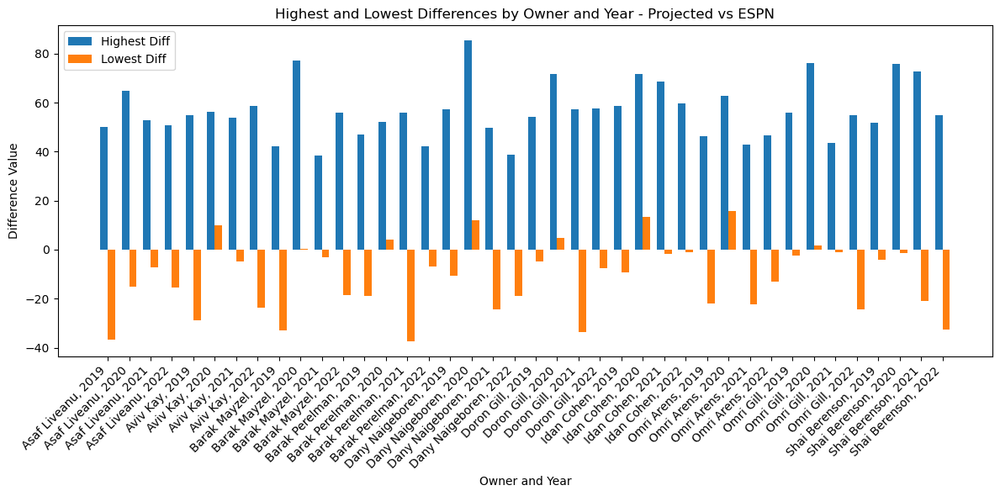

In [62]:
owners = []
years = []
highest_diffs = []
lowest_diffs = []

for (owner, year), group_data in owner_year_grouped:
    owners.append(owner)
    years.append(year)

    highest_diff = group_data['proj_vs_espn_diff'].max()
    lowest_diff = group_data['proj_vs_espn_diff'].min()
    
    highest_diffs.append(highest_diff)
    lowest_diffs.append(lowest_diff)

fig, ax = plt.subplots(figsize=(12, 6))
bar_width = 0.35

index = np.arange(len(owners))

bar1 = ax.bar(index, highest_diffs, bar_width, label='Highest Diff')
bar2 = ax.bar(index + bar_width, lowest_diffs, bar_width, label='Lowest Diff')

ax.set_xlabel('Owner and Year')
ax.set_ylabel('Difference Value')
ax.set_title('Highest and Lowest Differences by Owner and Year - Projected vs ESPN')

ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels([f'{owners[i]}, {years[i]}' for i in range(len(owners))], rotation=45, ha='right')
#ax.set_xticklabels([f'{owner}, {year}' for owner, year in zip(owners, years)], rotation=45, ha='right')
ax.legend()

plt.tight_layout()
plt.show()

In [63]:
for (owner, year), group_data in owner_year_grouped:
    print(f"Owner: {owner}, Year: {year}")
    
    highest_diff = group_data['real_vs_espn_diff'].max()
    lowest_diff = group_data['real_vs_espn_diff'].min()
    
    print(f"Highest Diff: {highest_diff}, Lowest Diff: {lowest_diff}")

Owner: Asaf Liveanu, Year: 2019
Highest Diff: 40.3, Lowest Diff: -3.8400000000000034
Owner: Asaf Liveanu, Year: 2020
Highest Diff: 68.80000000000001, Lowest Diff: 22.5
Owner: Asaf Liveanu, Year: 2021
Highest Diff: 42.20000000000002, Lowest Diff: 2.6000000000000085
Owner: Asaf Liveanu, Year: 2022
Highest Diff: 34.99999999999996, Lowest Diff: 7.59999999999998
Owner: Aviv Kay, Year: 2019
Highest Diff: 54.7, Lowest Diff: -20.400000000000006
Owner: Aviv Kay, Year: 2020
Highest Diff: 52.599999999999994, Lowest Diff: 22.10000000000001
Owner: Aviv Kay, Year: 2021
Highest Diff: 49.8, Lowest Diff: -7.159999999999997
Owner: Aviv Kay, Year: 2022
Highest Diff: 37.7, Lowest Diff: 2.5999999999999943
Owner: Barak Mayzel, Year: 2019
Highest Diff: 48.69999999999999, Lowest Diff: -15.200000000000045
Owner: Barak Mayzel, Year: 2020
Highest Diff: 55.8, Lowest Diff: 4.200000000000003
Owner: Barak Mayzel, Year: 2021
Highest Diff: 39.60000000000001, Lowest Diff: 3.4000000000000057
Owner: Barak Mayzel, Year: 2

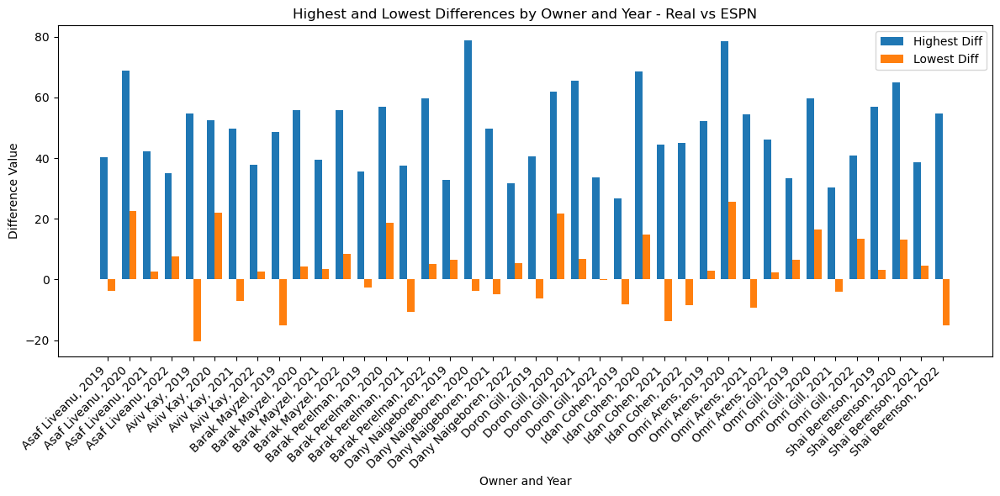

In [64]:
owners = []
years = []
highest_diffs = []
lowest_diffs = []

for (owner, year), group_data in owner_year_grouped:
    owners.append(owner)
    years.append(year)

    highest_diff = group_data['real_vs_espn_diff'].max()
    lowest_diff = group_data['real_vs_espn_diff'].min()
    
    highest_diffs.append(highest_diff)
    lowest_diffs.append(lowest_diff)

fig, ax = plt.subplots(figsize=(12, 6))
bar_width = 0.35

index = np.arange(len(owners))

bar1 = ax.bar(index, highest_diffs, bar_width, label='Highest Diff')
bar2 = ax.bar(index + bar_width, lowest_diffs, bar_width, label='Lowest Diff')

ax.set_xlabel('Owner and Year')
ax.set_ylabel('Difference Value')
ax.set_title('Highest and Lowest Differences by Owner and Year - Real vs ESPN')

ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels([f'{owners[i]}, {years[i]}' for i in range(len(owners))], rotation=45, ha='right')
#ax.set_xticklabels([f'{owner}, {year}' for owner, year in zip(owners, years)], rotation=45, ha='right')
ax.legend()

plt.tight_layout()
plt.show()

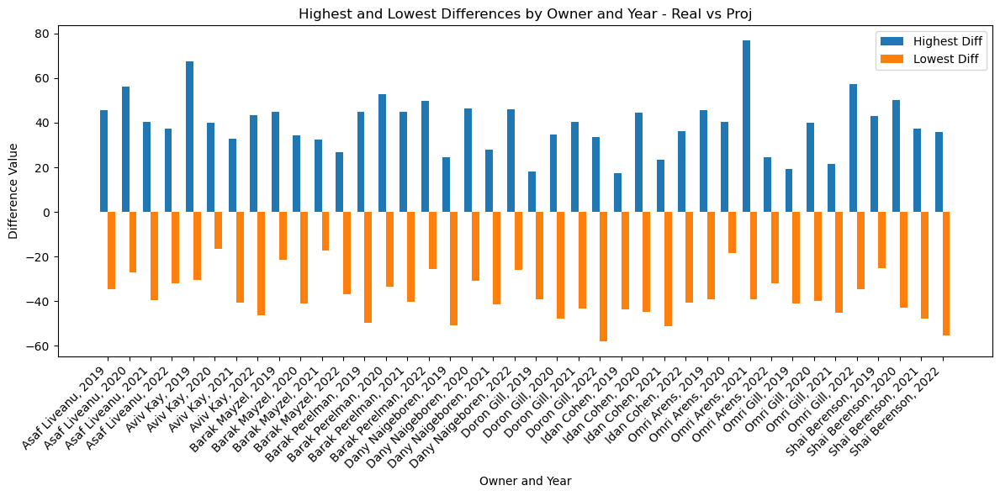

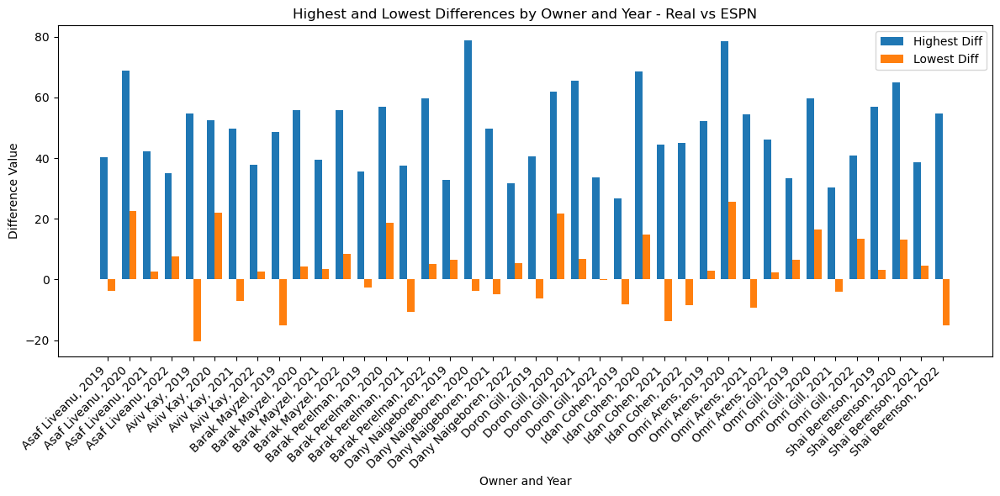

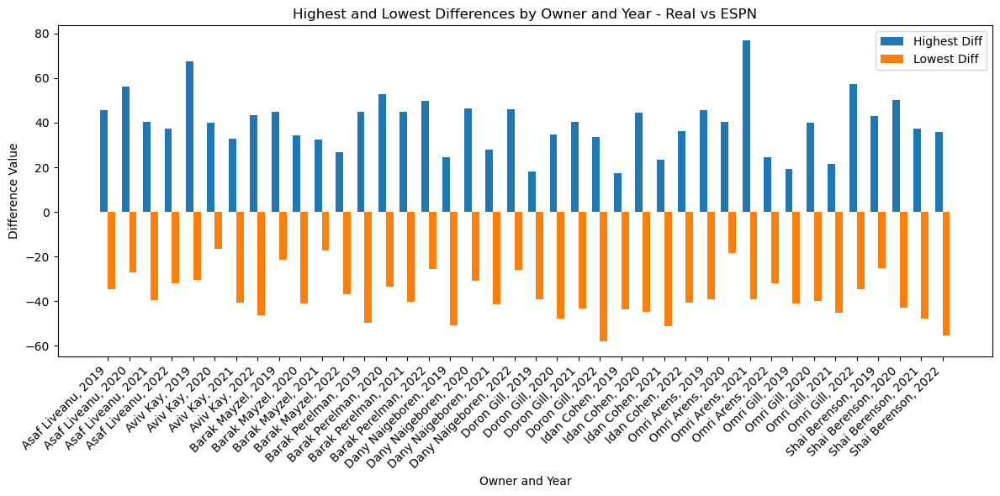

In [65]:
def generate_bar_chart(grouped_data, dataset_name, title):
    owners = []
    years = []
    highest_diffs = []
    lowest_diffs = []

    for (owner, year), group_data in grouped_data:
        owners.append(owner)
        years.append(year)

        highest_diff = group_data[f'real_vs_{dataset_name}_diff'].max()
        lowest_diff = group_data[f'real_vs_{dataset_name}_diff'].min()

        highest_diffs.append(highest_diff)
        lowest_diffs.append(lowest_diff)

    fig, ax = plt.subplots(figsize=(12, 6))
    bar_width = 0.35

    index = np.arange(len(owners))

    bar1 = ax.bar(index, highest_diffs, bar_width, label='Highest Diff')
    bar2 = ax.bar(index + bar_width, lowest_diffs, bar_width, label='Lowest Diff')

    ax.set_xlabel('Owner and Year')
    ax.set_ylabel('Difference Value')
    ax.set_title(f'Highest and Lowest Differences by Owner and Year - Real vs {title}')

    ax.set_xticks(index + bar_width / 2)
    ax.set_xticklabels([f'{owners[i]}, {years[i]}' for i in range(len(owners))], rotation=45, ha='right')
    ax.legend()

    plt.tight_layout()
    plt.show()

generate_bar_chart(owner_year_grouped, 'proj', 'Proj')
generate_bar_chart(owner_year_grouped, 'espn', 'ESPN')
generate_bar_chart(owner_year_grouped, 'proj', 'ESPN')

Tasks:
1. Using record.csv, check H2H matchups and cross reference with projections. See which owner is most compatible with projections.
2. Luck factor - each week, how many games i would've won that week, and did i actually win?

In [66]:
head_to_head_data = pd.read_csv(r"C:\Users\omrig\Downloads\Fantasy Football Data\record (2).csv")
head_to_head_data

,Unnamed: 0,owner,team,final_standing,reg_standing,team_wins,team_losses,points_for,points_agains,logo,league_wins,league_losses,league_ties,team_id,elo,year,lid
0,0,Doron Gill,Twin Peaks SackosNoMore,6,6,6,7,1245.00,1324.00,http://www.gravatar.com/avatar/9e6783a814c9307...,57,47,1,1,1358.680100,2014,747609
1,1,Aviv Kay,Team AK007,1,3,7,6,1280.00,1172.00,http://crackberry.com/sites/crackberry.com/fil...,60,44,1,2,1461.672231,2014,747609
2,2,Idan Cohen,Team CB,4,4,7,6,1238.00,1190.00,http://3.bp.blogspot.com/-pUhrWAXFjFo/UhdcoisJ...,46,57,2,3,1404.180193,2014,747609
3,3,Barak Perelman,Team Barakillers,7,5,6,6,1252.00,1299.00,http://upload.wikimedia.org/wikipedia/en/thumb...,48,56,1,4,1397.697238,2014,747609
4,4,Omri Gill,The Sacko Continues,8,8,3,9,1189.00,1321.00,http://media-cache-cd0.pinimg.com/736x/d8/45/c...,44,59,2,5,1249.383960,2014,747609
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,83,Asaf Liveanu,The Kittles,3,1,11,3,1683.80,1463.94,https://upload.wikimedia.org/wikipedia/en/thum...,91,60,1,6,1543.966056,2022,747609
84,84,Barak Mayzel,TFH: A New Hope,7,10,3,11,1473.22,1664.06,https://g.espncdn.com/lm-static/logo-packs/cor...,61,90,0,7,1240.470206,2022,747609
85,85,Shai Berenson,Polk High Panthers,4,2,9,5,1629.62,1538.38,https://g.espncdn.com/lm-static/logo-packs/ffl...,85,66,1,8,1439.599892,2022,747609
86,86,Omri Arens,F*ing Catalina Wine Mixon,9,7,7,7,1505.86,1544.68,https://g.espncdn.com/lm-static/logo-packs/ffl...,80,71,0,9,1420.941345,2022,747609


In [67]:
head_to_head_data = head_to_head_data.drop('logo', axis='columns')
head_to_head_data = head_to_head_data.drop('lid', axis='columns')
head_to_head_data = head_to_head_data.drop('team', axis='columns')
head_to_head_data = head_to_head_data.drop('Unnamed: 0', axis='columns')
head_to_head_data = head_to_head_data[head_to_head_data['year'] != 2014]
head_to_head_data.rename(columns={'points_agains':'points_against'}, inplace=True)

                                      
head_to_head_data

,owner,final_standing,reg_standing,team_wins,team_losses,points_for,points_against,league_wins,league_losses,league_ties,team_id,elo,year
8,Doron Gill,1,1,10,4,1372.98,1176.60,85,59,0,1,1544.555767,2015
9,Idan Cohen,2,4,8,6,1598.18,1600.94,69,75,0,3,1424.298272,2018
10,Aviv Kay,8,8,6,8,1309.18,1315.88,61,83,0,2,1363.235057,2015
11,Idan Cohen,4,4,8,6,1229.56,1206.06,58,86,0,3,1420.401185,2015
12,Barak Perelman,5,6,7,7,1455.50,1315.30,86,58,0,4,1362.624289,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,Asaf Liveanu,3,1,11,3,1683.80,1463.94,91,60,1,6,1543.966056,2022
84,Barak Mayzel,7,10,3,11,1473.22,1664.06,61,90,0,7,1240.470206,2022
85,Shai Berenson,4,2,9,5,1629.62,1538.38,85,66,1,8,1439.599892,2022
86,Omri Arens,9,7,7,7,1505.86,1544.68,80,71,0,9,1420.941345,2022


In [68]:
head_to_head_data['owner'].value_counts()

Doron Gill         8
Idan Cohen         8
Aviv Kay           8
Barak Perelman     8
Omri Gill          8
Asaf Liveanu       8
Barak Mayzel       8
Omri Arens         8
Dany Naigeboren    8
shai berenson      6
Shai Berenson      2
Name: owner, dtype: int64

In [69]:
head_to_head_data['owner'].replace('shai berenson', 'Shai Berenson', inplace=True)

In [70]:
head_to_head_data.columns

Index(['owner', 'final_standing', 'reg_standing', 'team_wins', 'team_losses',
       'points_for', 'points_against', 'league_wins', 'league_losses',
       'league_ties', 'team_id', 'elo', 'year'],
      dtype='object')

In [71]:
head_to_head_data

,owner,final_standing,reg_standing,team_wins,team_losses,points_for,points_against,league_wins,league_losses,league_ties,team_id,elo,year
8,Doron Gill,1,1,10,4,1372.98,1176.60,85,59,0,1,1544.555767,2015
9,Idan Cohen,2,4,8,6,1598.18,1600.94,69,75,0,3,1424.298272,2018
10,Aviv Kay,8,8,6,8,1309.18,1315.88,61,83,0,2,1363.235057,2015
11,Idan Cohen,4,4,8,6,1229.56,1206.06,58,86,0,3,1420.401185,2015
12,Barak Perelman,5,6,7,7,1455.50,1315.30,86,58,0,4,1362.624289,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,Asaf Liveanu,3,1,11,3,1683.80,1463.94,91,60,1,6,1543.966056,2022
84,Barak Mayzel,7,10,3,11,1473.22,1664.06,61,90,0,7,1240.470206,2022
85,Shai Berenson,4,2,9,5,1629.62,1538.38,85,66,1,8,1439.599892,2022
86,Omri Arens,9,7,7,7,1505.86,1544.68,80,71,0,9,1420.941345,2022


In [72]:
h2h_pivot = head_to_head_data.pivot_table(index='owner', aggfunc='mean')
h2h_pivot

,elo,final_standing,league_losses,league_ties,league_wins,points_against,points_for,reg_standing,team_id,team_losses,team_wins,year
owner,,,,,,,,,,,,
Asaf Liveanu,1445.600234,5.750,70.000,0.250,75.125,1457.1025,1488.3550,4.625,6,6.000,7.750,2018.5
Aviv Kay,1375.923664,5.375,71.750,0.250,73.250,1487.4350,1473.6400,5.500,2,7.250,6.500,2018.5
Barak Mayzel,1421.497124,5.375,68.875,0.125,76.375,1480.2525,1480.1225,5.000,7,6.500,7.250,2018.5
Barak Perelman,1457.529224,2.875,67.000,0.375,78.000,1419.7350,1522.1450,3.375,4,5.375,8.375,2018.5
Dany Naigeboren,1317.117317,8.125,84.750,0.125,60.375,1467.3950,1369.1025,8.375,10,8.625,5.125,2018.5
Doron Gill,1395.078724,5.125,70.750,0.250,74.375,1465.7975,1443.8900,5.875,1,7.125,6.625,2018.5
Idan Cohen,1361.848520,5.750,81.375,0.125,63.750,1478.7500,1395.6275,5.875,3,7.625,6.125,2018.5
Omri Arens,1434.565012,5.125,72.250,0.250,72.875,1450.6675,1453.7625,4.750,9,6.250,7.500,2018.5
Omri Gill,1365.173001,6.125,75.125,0.250,69.875,1416.3000,1437.8000,7.000,5,7.750,6.000,2018.5


In [73]:
h2h_pivot = h2h_pivot.drop('year', axis='columns')
h2h_pivot

,elo,final_standing,league_losses,league_ties,league_wins,points_against,points_for,reg_standing,team_id,team_losses,team_wins
owner,,,,,,,,,,,
Asaf Liveanu,1445.600234,5.750,70.000,0.250,75.125,1457.1025,1488.3550,4.625,6,6.000,7.750
Aviv Kay,1375.923664,5.375,71.750,0.250,73.250,1487.4350,1473.6400,5.500,2,7.250,6.500
Barak Mayzel,1421.497124,5.375,68.875,0.125,76.375,1480.2525,1480.1225,5.000,7,6.500,7.250
Barak Perelman,1457.529224,2.875,67.000,0.375,78.000,1419.7350,1522.1450,3.375,4,5.375,8.375
Dany Naigeboren,1317.117317,8.125,84.750,0.125,60.375,1467.3950,1369.1025,8.375,10,8.625,5.125
Doron Gill,1395.078724,5.125,70.750,0.250,74.375,1465.7975,1443.8900,5.875,1,7.125,6.625
Idan Cohen,1361.848520,5.750,81.375,0.125,63.750,1478.7500,1395.6275,5.875,3,7.625,6.125
Omri Arens,1434.565012,5.125,72.250,0.250,72.875,1450.6675,1453.7625,4.750,9,6.250,7.500
Omri Gill,1365.173001,6.125,75.125,0.250,69.875,1416.3000,1437.8000,7.000,5,7.750,6.000


In [74]:
h2h_pivot.columns

Index(['elo', 'final_standing', 'league_losses', 'league_ties', 'league_wins',
       'points_against', 'points_for', 'reg_standing', 'team_id',
       'team_losses', 'team_wins'],
      dtype='object')

<AxesSubplot:xlabel='owner'>

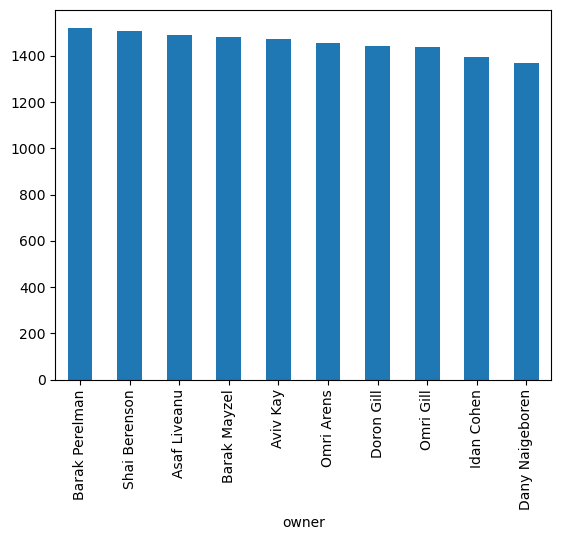

In [75]:
h2h_pivot['points_for'].sort_values(ascending=False).plot(kind='bar')

<AxesSubplot:xlabel='owner'>

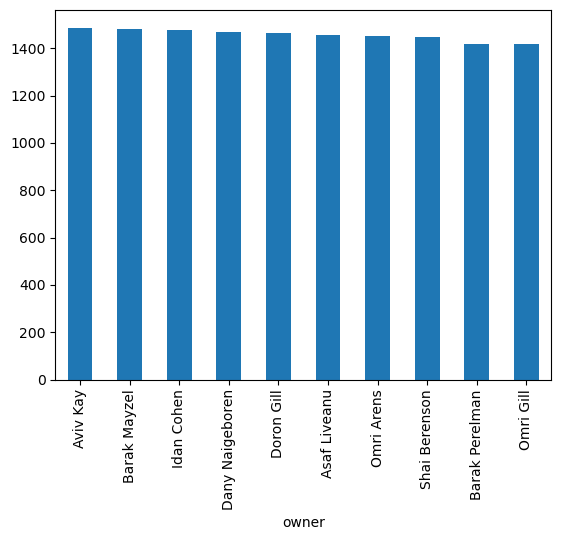

In [76]:
h2h_pivot['points_against'].sort_values(ascending=False).plot(kind='bar')

In [77]:
h2h_pivot['points_diff'] = h2h_pivot['points_for'] - h2h_pivot['points_against']
h2h_pivot

,elo,final_standing,league_losses,league_ties,league_wins,points_against,points_for,reg_standing,team_id,team_losses,team_wins,points_diff
owner,,,,,,,,,,,,
Asaf Liveanu,1445.600234,5.750,70.000,0.250,75.125,1457.1025,1488.3550,4.625,6,6.000,7.750,31.2525
Aviv Kay,1375.923664,5.375,71.750,0.250,73.250,1487.4350,1473.6400,5.500,2,7.250,6.500,-13.7950
Barak Mayzel,1421.497124,5.375,68.875,0.125,76.375,1480.2525,1480.1225,5.000,7,6.500,7.250,-0.1300
Barak Perelman,1457.529224,2.875,67.000,0.375,78.000,1419.7350,1522.1450,3.375,4,5.375,8.375,102.4100
Dany Naigeboren,1317.117317,8.125,84.750,0.125,60.375,1467.3950,1369.1025,8.375,10,8.625,5.125,-98.2925
Doron Gill,1395.078724,5.125,70.750,0.250,74.375,1465.7975,1443.8900,5.875,1,7.125,6.625,-21.9075
Idan Cohen,1361.848520,5.750,81.375,0.125,63.750,1478.7500,1395.6275,5.875,3,7.625,6.125,-83.1225
Omri Arens,1434.565012,5.125,72.250,0.250,72.875,1450.6675,1453.7625,4.750,9,6.250,7.500,3.0950
Omri Gill,1365.173001,6.125,75.125,0.250,69.875,1416.3000,1437.8000,7.000,5,7.750,6.000,21.5000


<AxesSubplot:xlabel='owner'>

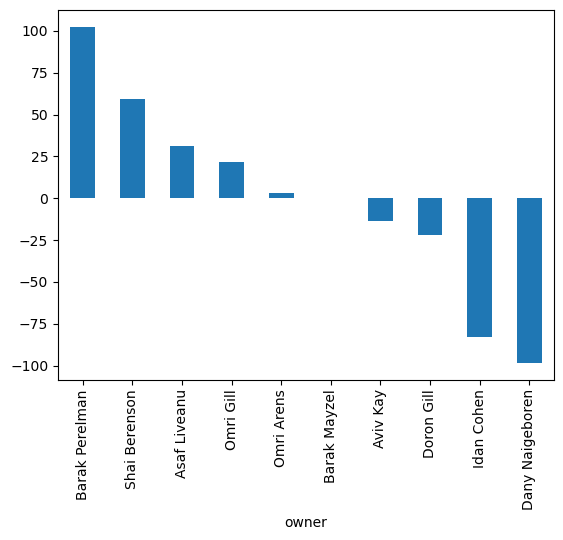

In [78]:
h2h_pivot['points_diff'].sort_values(ascending=False).plot(kind='bar')

In [79]:
h2h_pivot['team_win_loss_diff'] = h2h_pivot['team_wins'] - h2h_pivot['team_losses']
h2h_pivot

,elo,final_standing,league_losses,league_ties,league_wins,points_against,points_for,reg_standing,team_id,team_losses,team_wins,points_diff,team_win_loss_diff
owner,,,,,,,,,,,,,
Asaf Liveanu,1445.600234,5.750,70.000,0.250,75.125,1457.1025,1488.3550,4.625,6,6.000,7.750,31.2525,1.75
Aviv Kay,1375.923664,5.375,71.750,0.250,73.250,1487.4350,1473.6400,5.500,2,7.250,6.500,-13.7950,-0.75
Barak Mayzel,1421.497124,5.375,68.875,0.125,76.375,1480.2525,1480.1225,5.000,7,6.500,7.250,-0.1300,0.75
Barak Perelman,1457.529224,2.875,67.000,0.375,78.000,1419.7350,1522.1450,3.375,4,5.375,8.375,102.4100,3.00
Dany Naigeboren,1317.117317,8.125,84.750,0.125,60.375,1467.3950,1369.1025,8.375,10,8.625,5.125,-98.2925,-3.50
Doron Gill,1395.078724,5.125,70.750,0.250,74.375,1465.7975,1443.8900,5.875,1,7.125,6.625,-21.9075,-0.50
Idan Cohen,1361.848520,5.750,81.375,0.125,63.750,1478.7500,1395.6275,5.875,3,7.625,6.125,-83.1225,-1.50
Omri Arens,1434.565012,5.125,72.250,0.250,72.875,1450.6675,1453.7625,4.750,9,6.250,7.500,3.0950,1.25
Omri Gill,1365.173001,6.125,75.125,0.250,69.875,1416.3000,1437.8000,7.000,5,7.750,6.000,21.5000,-1.75


<AxesSubplot:xlabel='owner'>

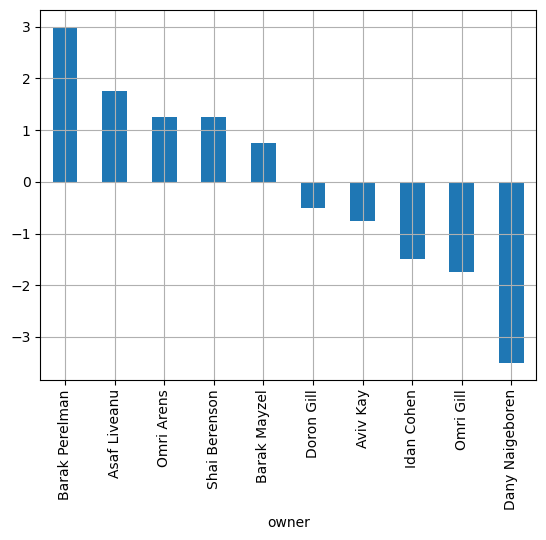

In [80]:
h2h_pivot['team_win_loss_diff'].sort_values(ascending=False).plot(kind='bar', grid=True)

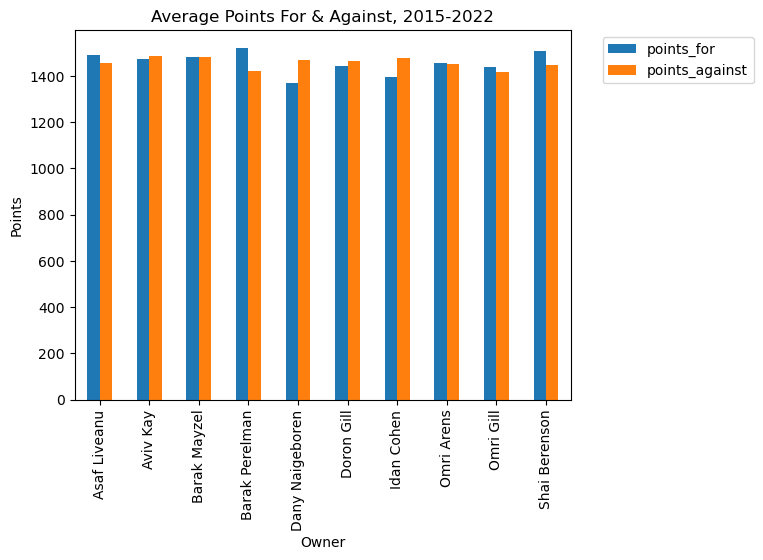

In [81]:
h2h_pivot[['points_for', 'points_against']].plot(kind='bar')

plt.xlabel('Owner')
plt.ylabel('Points')
plt.title('Average Points For & Against, 2015-2022')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [82]:
weekly_data = pd.read_csv(r"C:\Users\omrig\Downloads\Fantasy Football Data\weekly_scores (1).csv")
weekly_data

,Unnamed: 0,week,team_id,real_score,opp_score,owner,team,year,lid
0,0,12.0,2,106.00,121.00,Aviv Kay,Team AK007,2014,747609
1,1,1.0,2,99.00,93.00,Aviv Kay,Team AK007,2014,747609
2,2,2.0,2,128.00,80.00,Aviv Kay,Team AK007,2014,747609
3,3,3.0,2,75.00,99.00,Aviv Kay,Team AK007,2014,747609
4,4,4.0,2,77.00,114.00,Aviv Kay,Team AK007,2014,747609
...,...,...,...,...,...,...,...,...,...
1327,1327,12.0,1,111.18,140.84,Doron Gill,Twin Peaks Nikos,2018,747609
1328,1328,13.0,1,104.86,100.62,Doron Gill,Twin Peaks Nikos,2018,747609
1329,1329,14.0,1,86.02,116.40,Doron Gill,Twin Peaks Nikos,2018,747609
1330,1330,15.0,1,75.58,109.16,Doron Gill,Twin Peaks Nikos,2018,747609


In [83]:
weekly_data['owner'].replace('shai berenson', 'Shai Berenson', inplace=True)
weekly_data = weekly_data.drop('lid', axis='columns')
weekly_data = weekly_data.drop('Unnamed: 0', axis='columns')
weekly_data = weekly_data[weekly_data['year'] != 2014]

weekly_data

,week,team_id,real_score,opp_score,owner,team,year
12,2.0,8,92.78,125.98,Shai Berenson,Polk High Panthers,2018
13,3.0,8,114.60,81.92,Shai Berenson,Polk High Panthers,2018
14,4.0,8,87.42,92.78,Shai Berenson,Polk High Panthers,2018
15,5.0,8,106.78,137.92,Shai Berenson,Polk High Panthers,2018
16,6.0,8,135.20,118.12,Shai Berenson,Polk High Panthers,2018
...,...,...,...,...,...,...,...
1327,12.0,1,111.18,140.84,Doron Gill,Twin Peaks Nikos,2018
1328,13.0,1,104.86,100.62,Doron Gill,Twin Peaks Nikos,2018
1329,14.0,1,86.02,116.40,Doron Gill,Twin Peaks Nikos,2018
1330,15.0,1,75.58,109.16,Doron Gill,Twin Peaks Nikos,2018


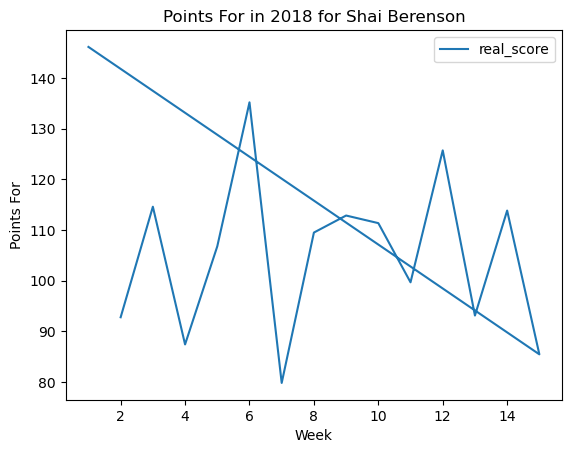

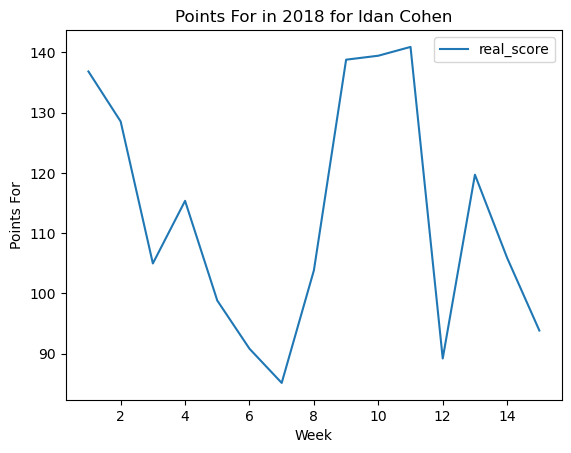

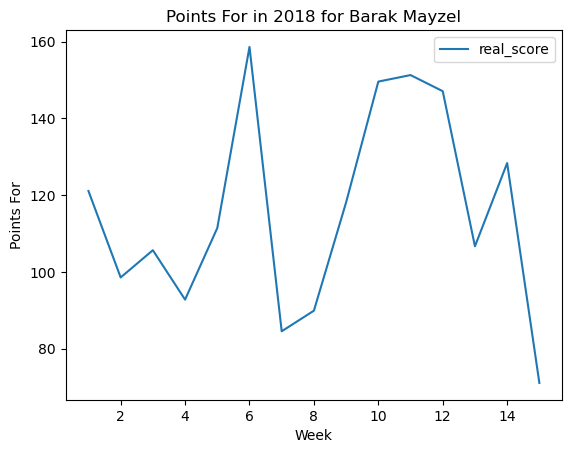

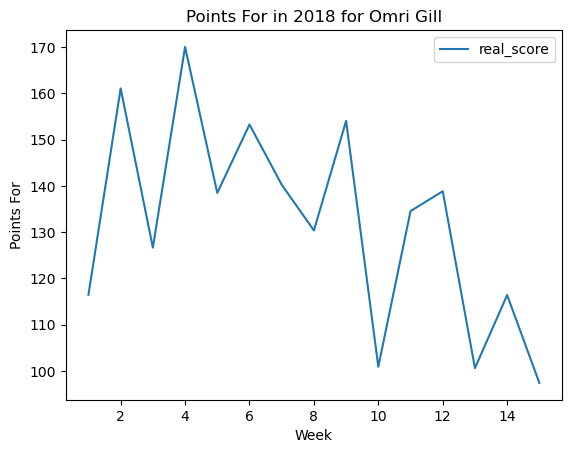

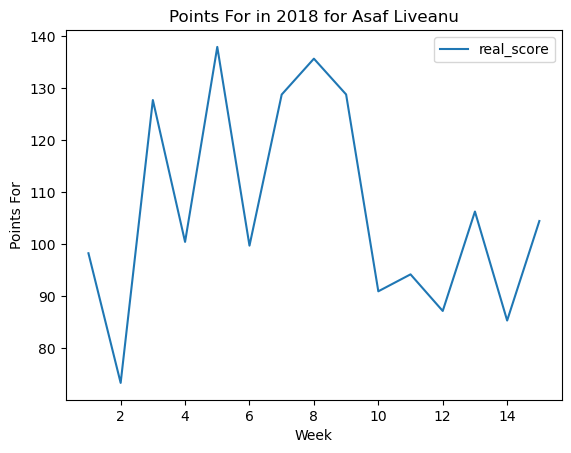

...

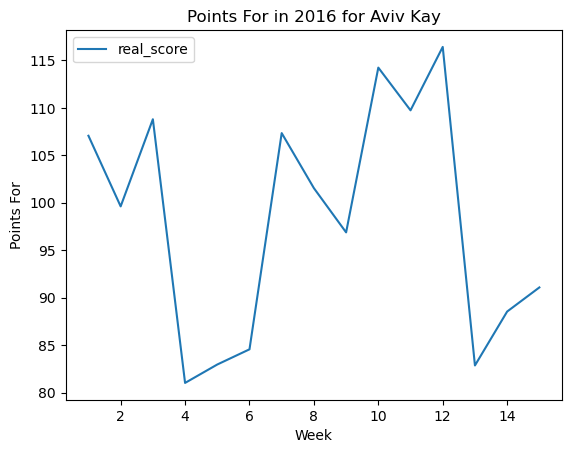

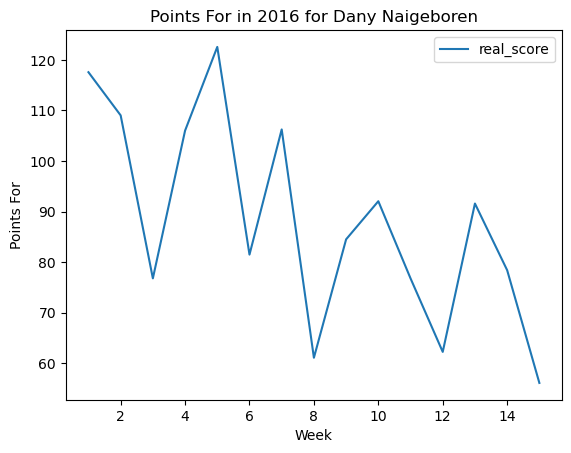

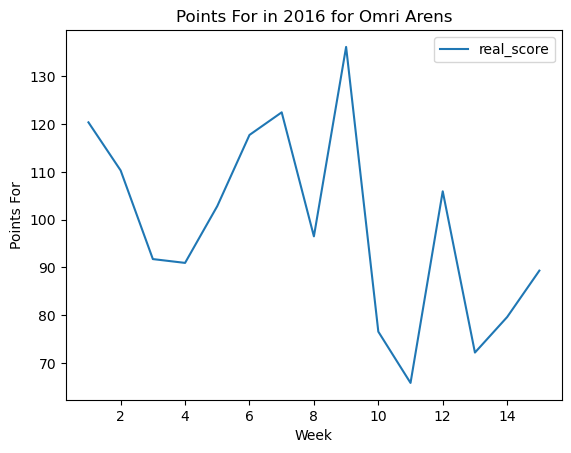

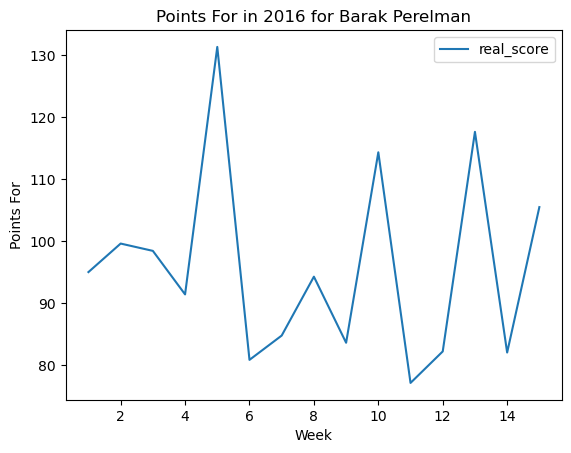

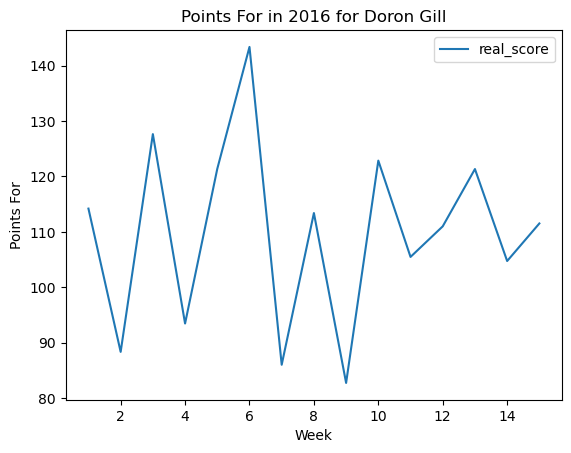

In [86]:
import matplotlib.pyplot as plt

# Assuming 'weekly_data' is your DataFrame, 'year' is the column containing the years, and 'owner' is the column containing the owners
for year in weekly_data['year'].unique():
    for owner in weekly_data['owner'].unique():
        # Filter the data for the current year and owner
        data_for_year_owner = weekly_data[(weekly_data['year'] == year) & (weekly_data['owner'] == owner)]
        
        # Plot the data for the current year and owner
        data_for_year_owner.plot(x='week', y='real_score', kind='line', title=f'Points For in {year} for {owner}')
        
        plt.xlabel('Week')
        plt.ylabel('Points For')
        plt.show()

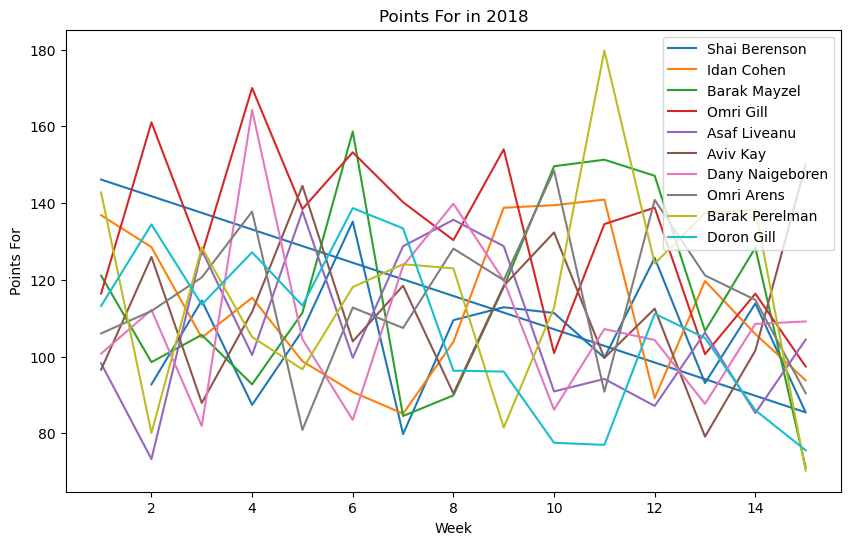

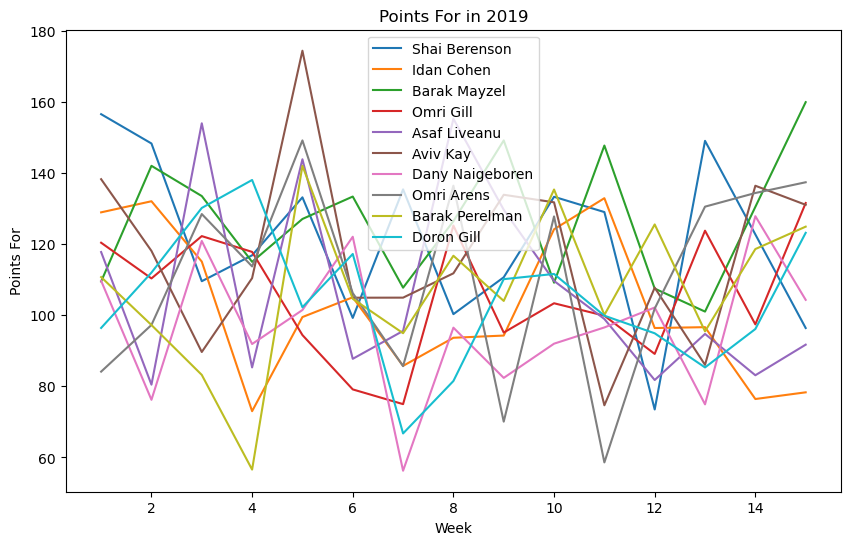

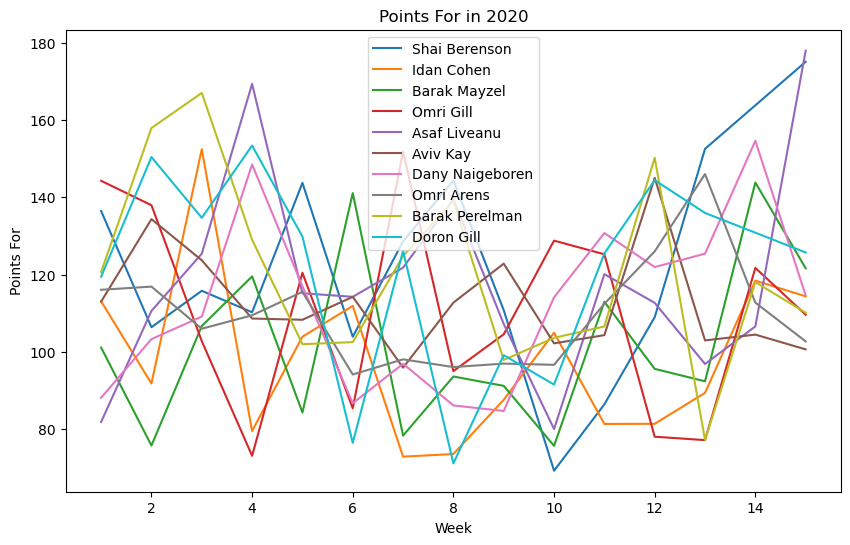

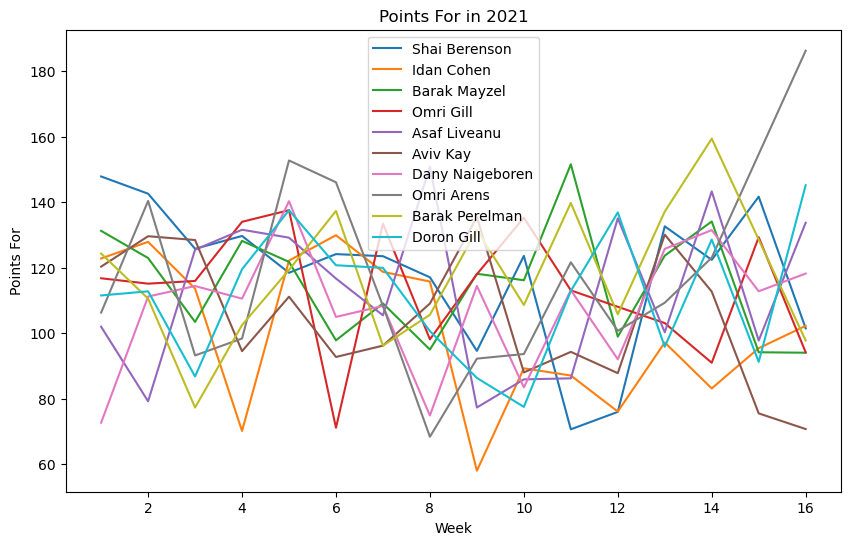

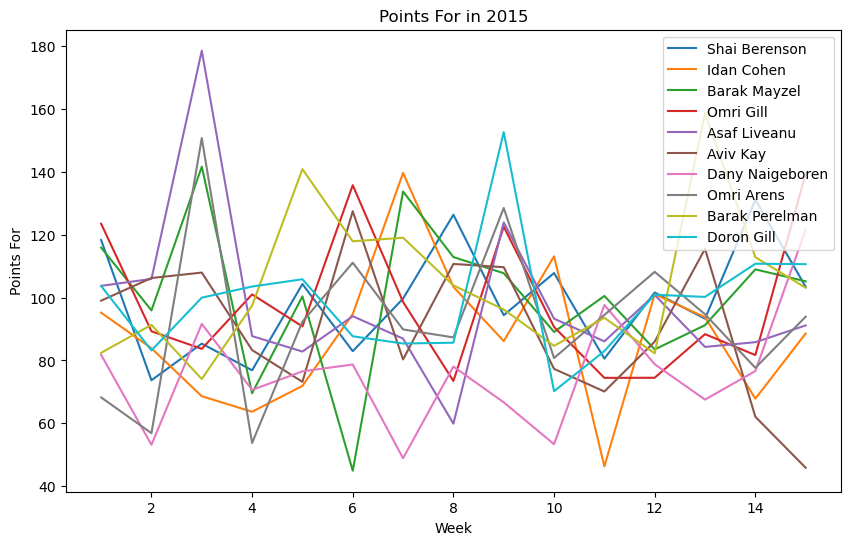

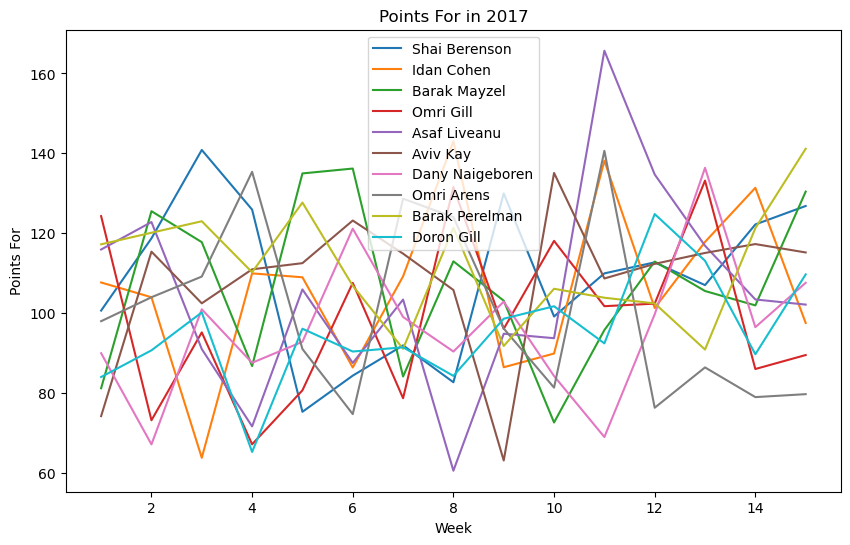

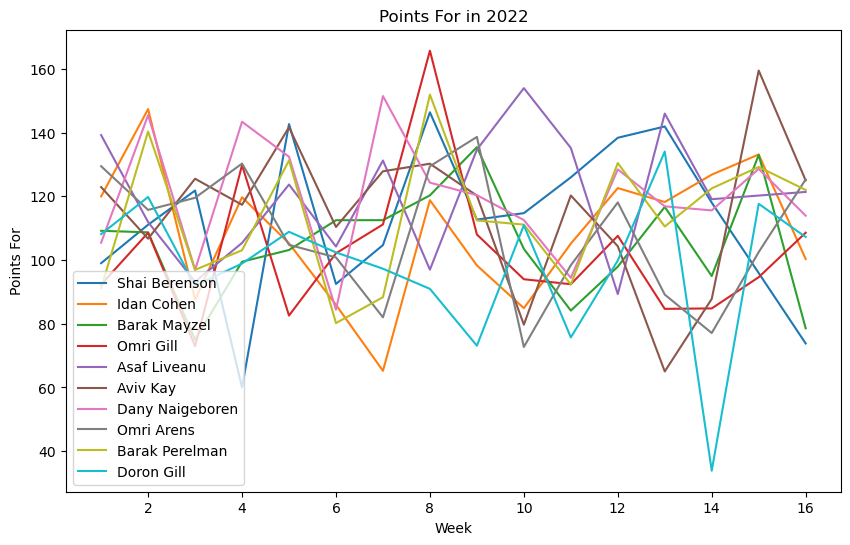

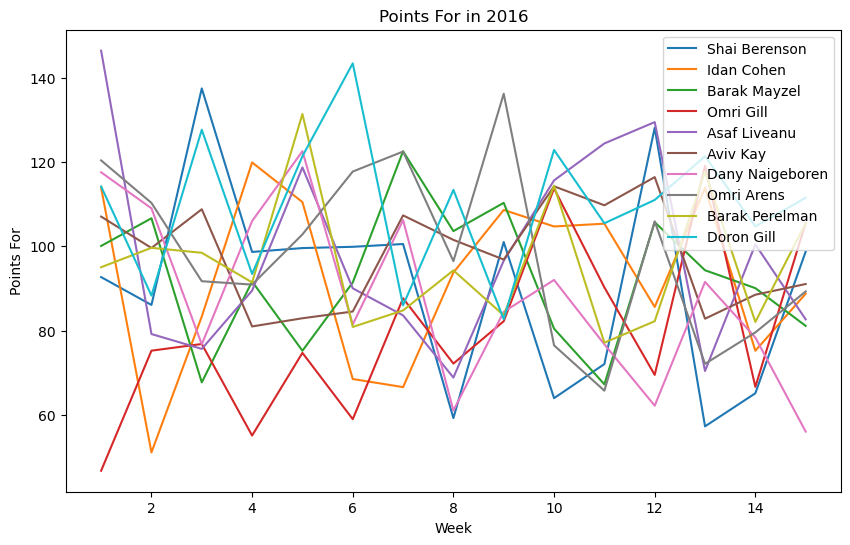

In [87]:
import matplotlib.pyplot as plt

# Assuming 'weekly_data' is your DataFrame, 'year' is the column containing the years, and 'owner' is the column containing the owners
for year in weekly_data['year'].unique():
    plt.figure(figsize=(10,6))
    for owner in weekly_data['owner'].unique():
        # Filter the data for the current year and owner
        data_for_year_owner = weekly_data[(weekly_data['year'] == year) & (weekly_data['owner'] == owner)]
        
        # Plot the data for the current year and owner
        plt.plot(data_for_year_owner['week'], data_for_year_owner['real_score'], label=owner)
    
    plt.xlabel('Week')
    plt.ylabel('Points For')
    plt.title(f'Points For in {year}')
    plt.legend()
    plt.show()

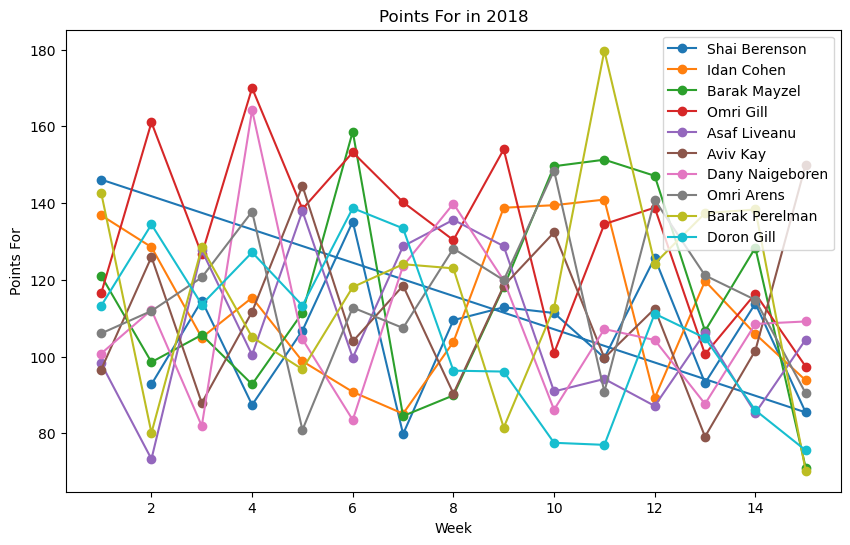

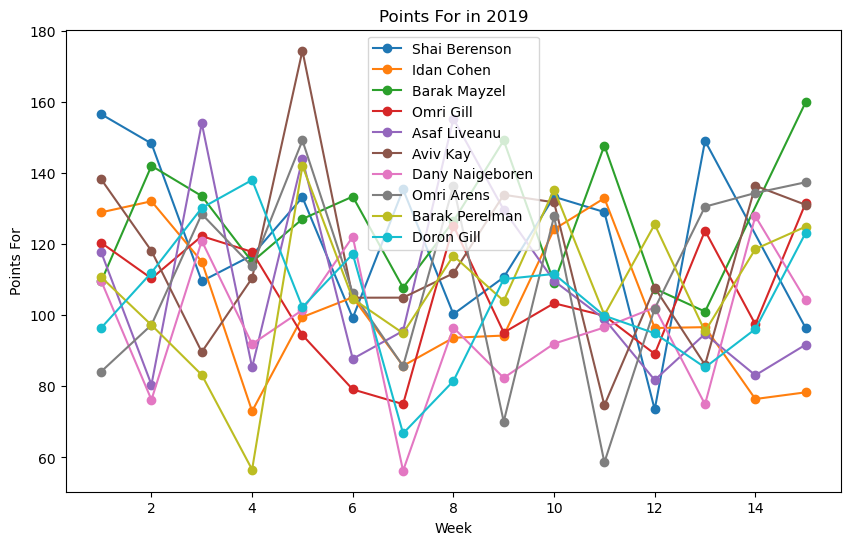

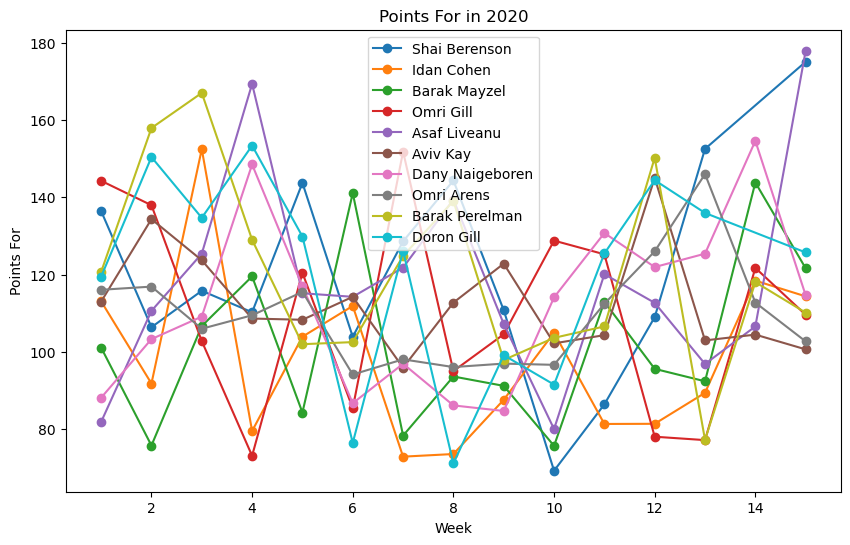

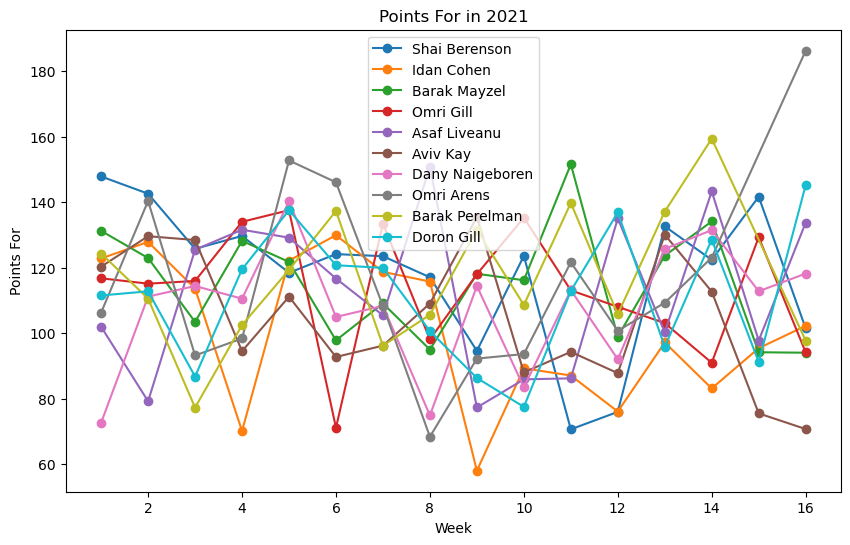

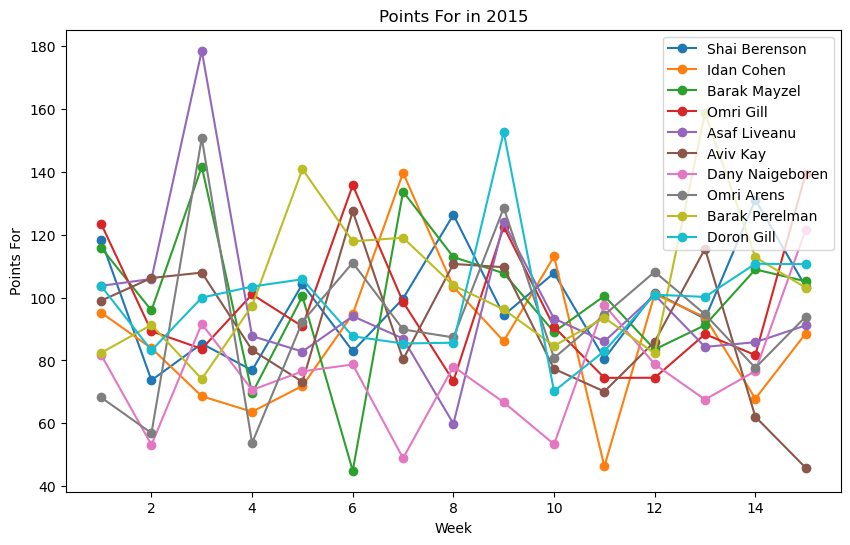

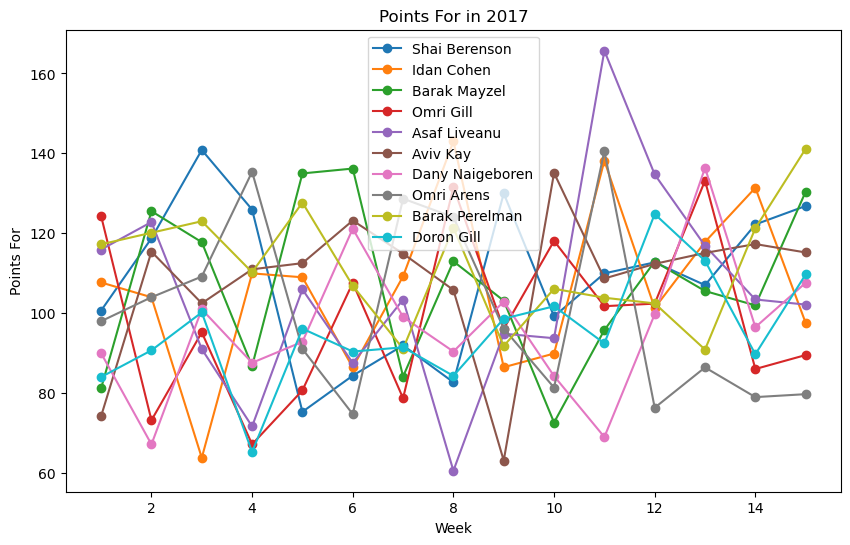

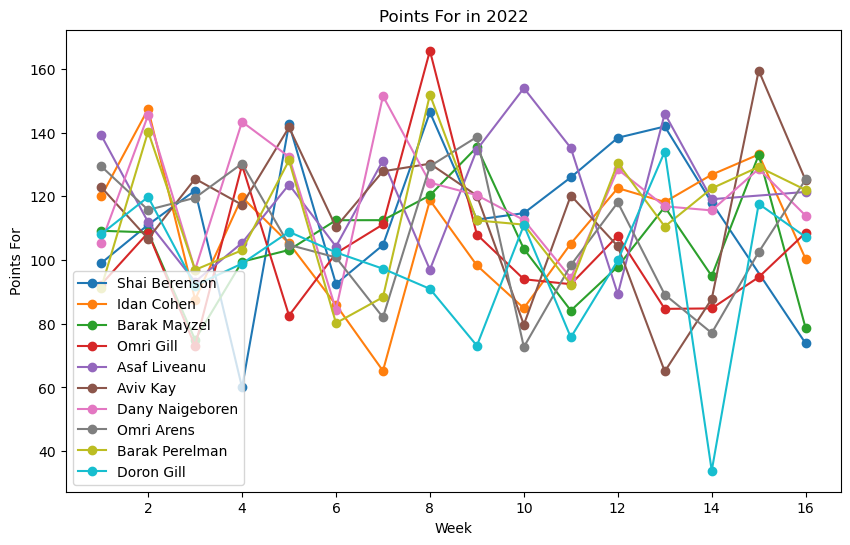

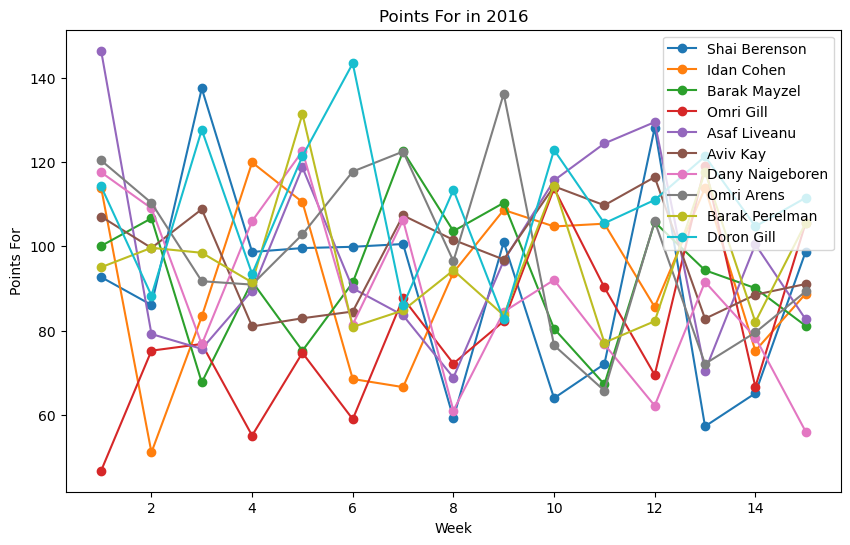

In [89]:
import matplotlib.pyplot as plt

# Assuming 'weekly_data' is your DataFrame, 'year' is the column containing the years, and 'owner' is the column containing the owners
for year in weekly_data['year'].unique():
    plt.figure(figsize=(10,6))
    for owner in weekly_data['owner'].unique():
        # Filter the data for the current year and owner
        data_for_year_owner = weekly_data[(weekly_data['year'] == year) & (weekly_data['owner'] == owner)]
        
        # Plot the data for the current year and owner
        plt.plot(data_for_year_owner['week'], data_for_year_owner['real_score'], marker='o', label=owner)
    
    plt.xlabel('Week')
    plt.ylabel('Points For')
    plt.title(f'Points For in {year}')
    plt.legend()
    plt.show()

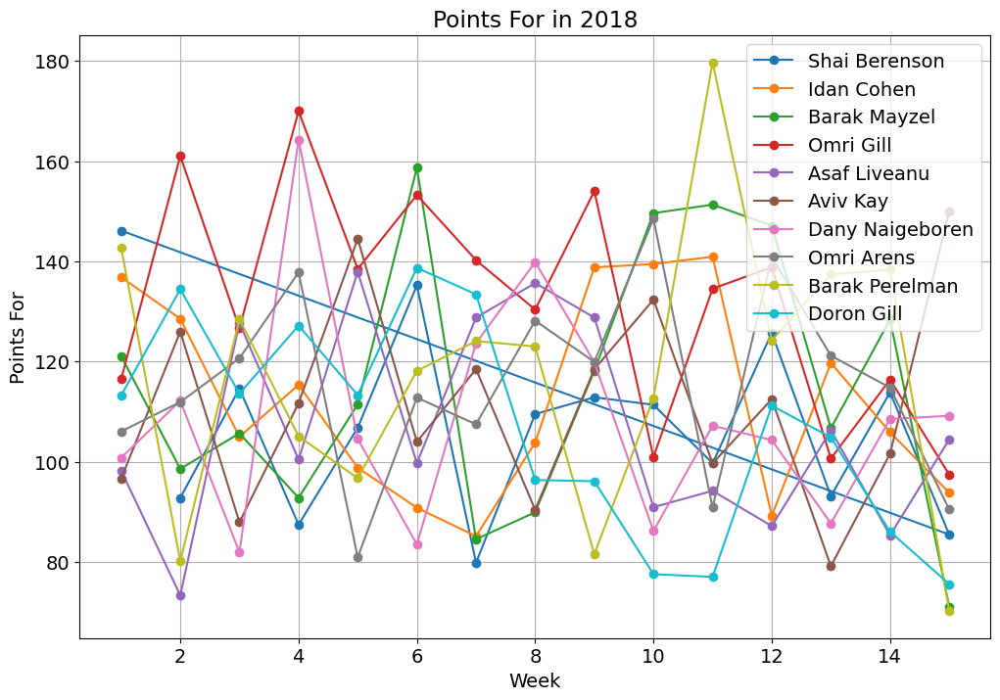

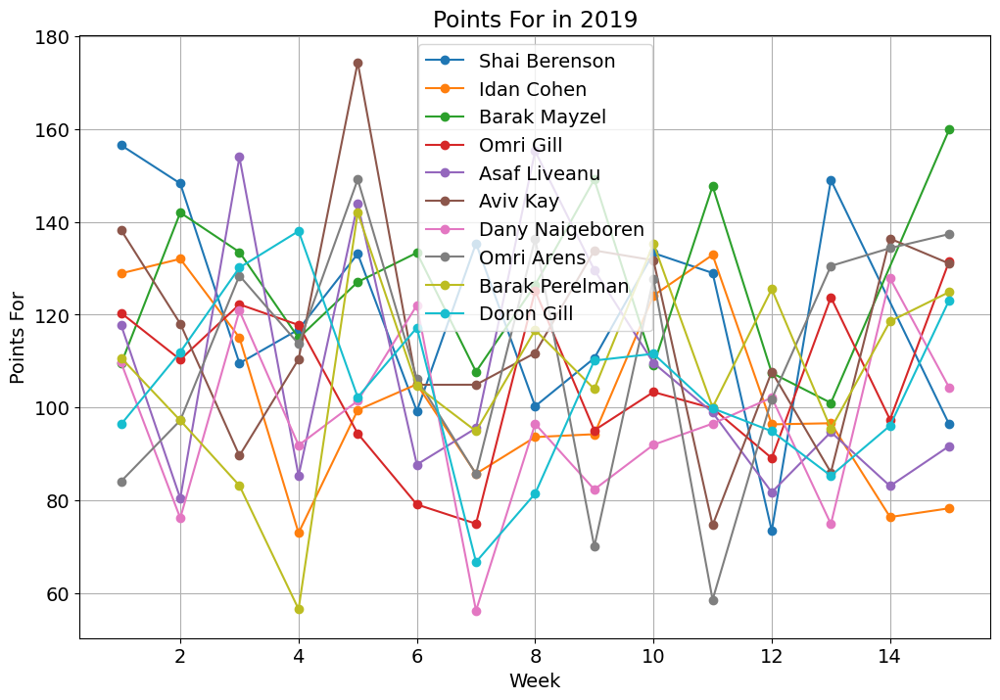

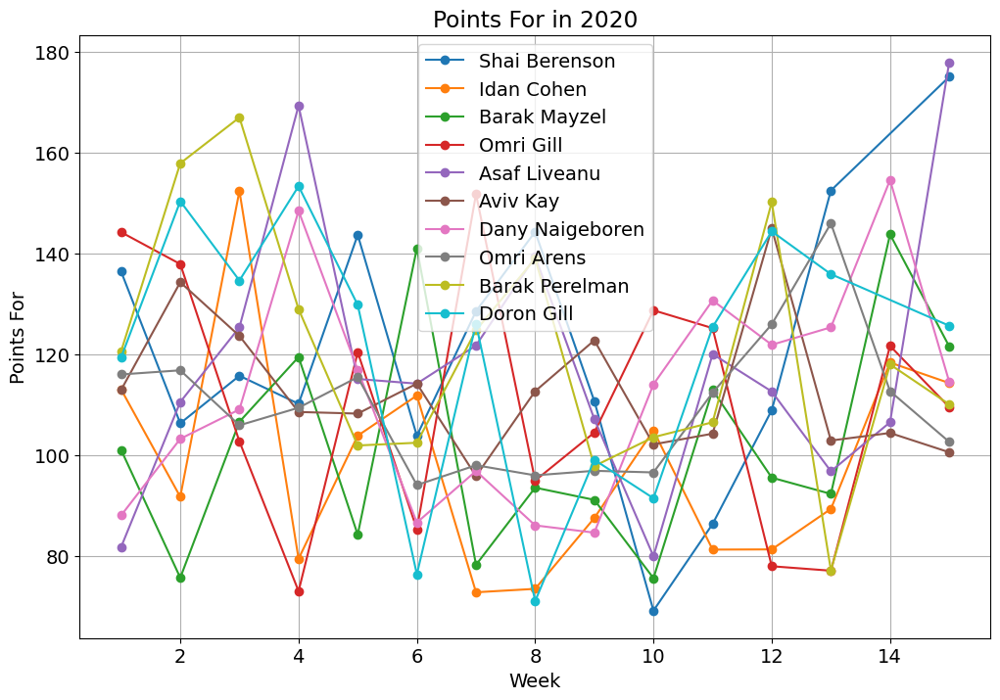

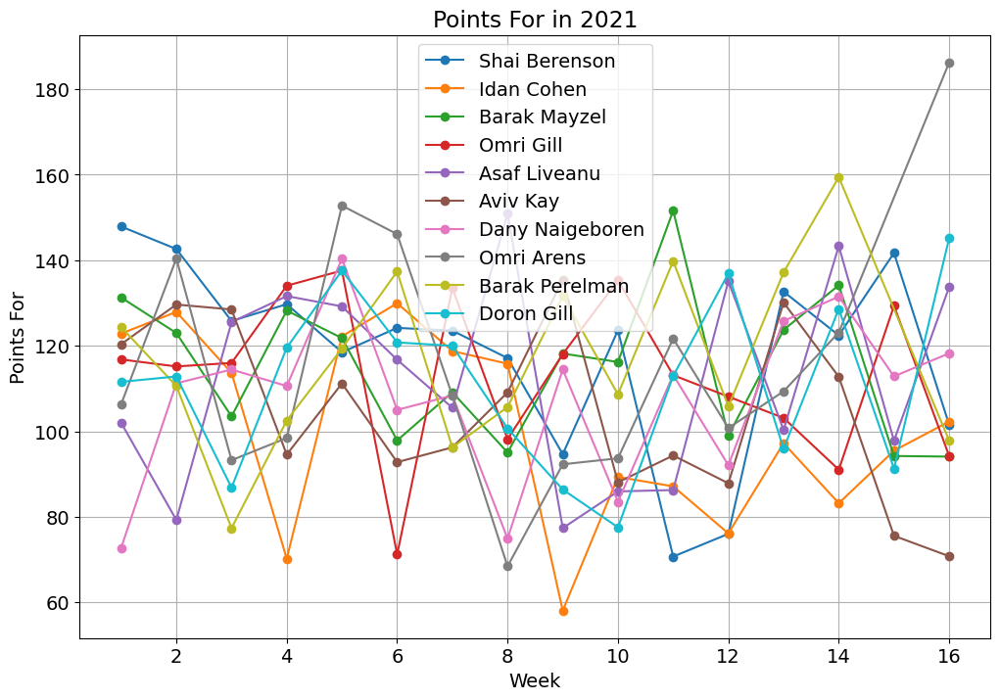

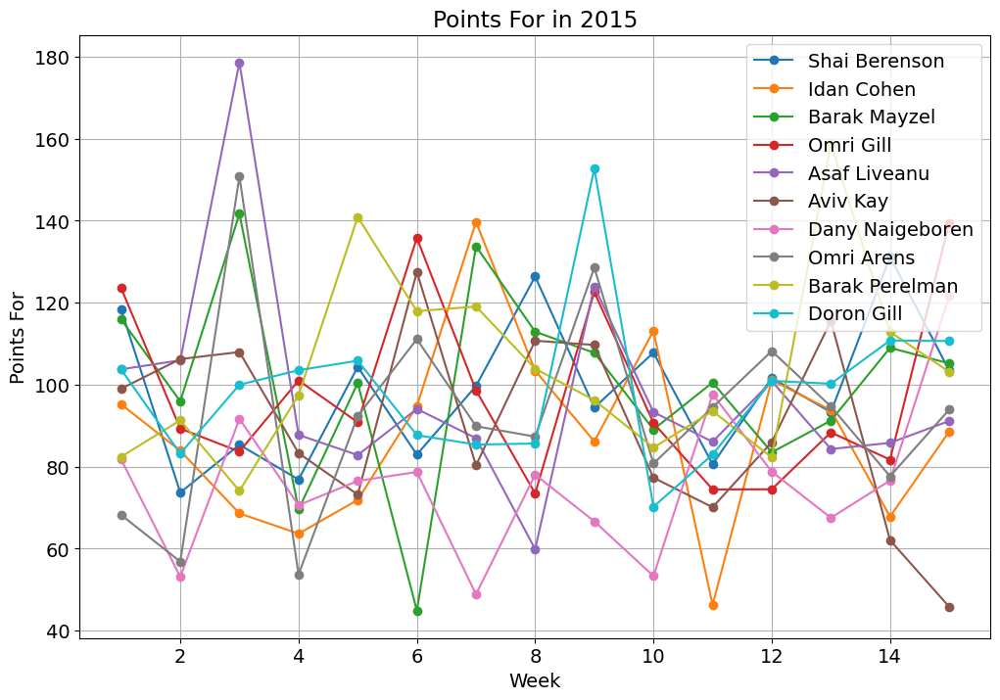

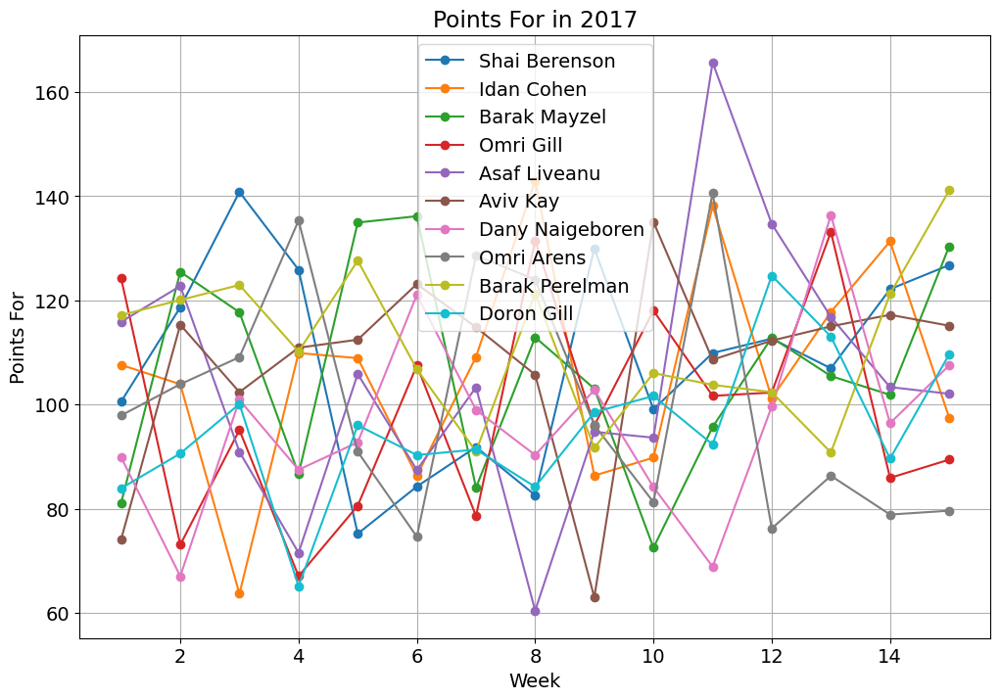

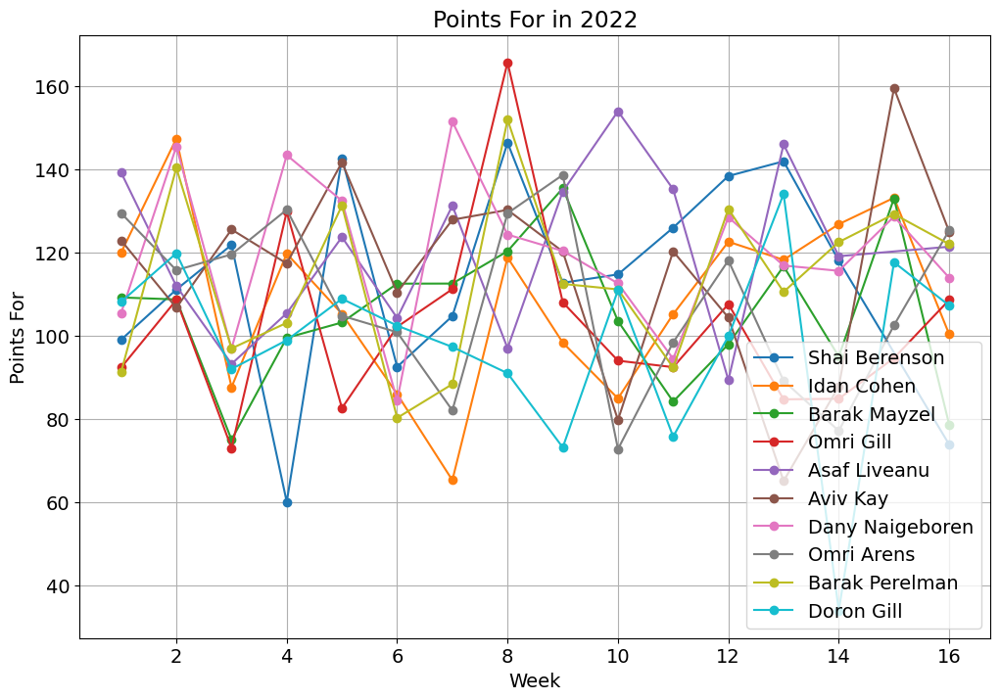

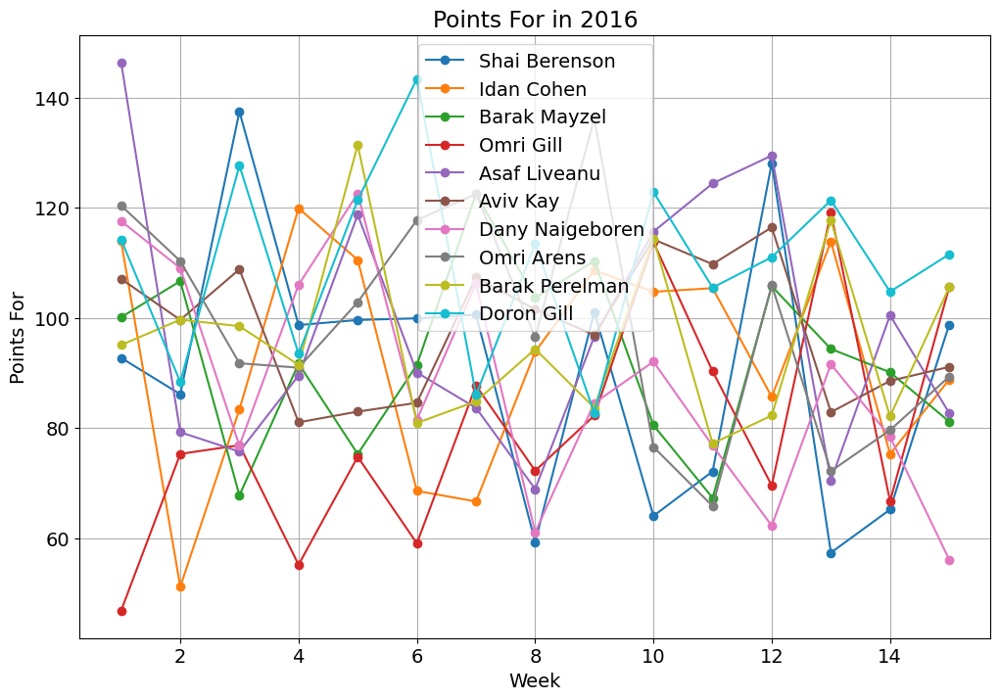

In [90]:
import matplotlib.pyplot as plt

# Increase the default font size
plt.rcParams.update({'font.size': 14})

# Assuming 'weekly_data' is your DataFrame, 'year' is the column containing the years, and 'owner' is the column containing the owners
for year in weekly_data['year'].unique():
    plt.figure(figsize=(12,8))  # Increase the figure size
    for i, owner in enumerate(weekly_data['owner'].unique()):
        # Filter the data for the current year and owner
        data_for_year_owner = weekly_data[(weekly_data['year'] == year) & (weekly_data['owner'] == owner)]
        
        # Plot the data for the current year and owner, using a different line style for each owner
        plt.plot(data_for_year_owner['week'], data_for_year_owner['real_score'], marker='o', linestyle='-', label=owner)
    
    plt.xlabel('Week')
    plt.ylabel('Points For')
    plt.title(f'Points For in {year}')
    plt.grid(True)  # Add a grid
    plt.legend()
    plt.show()

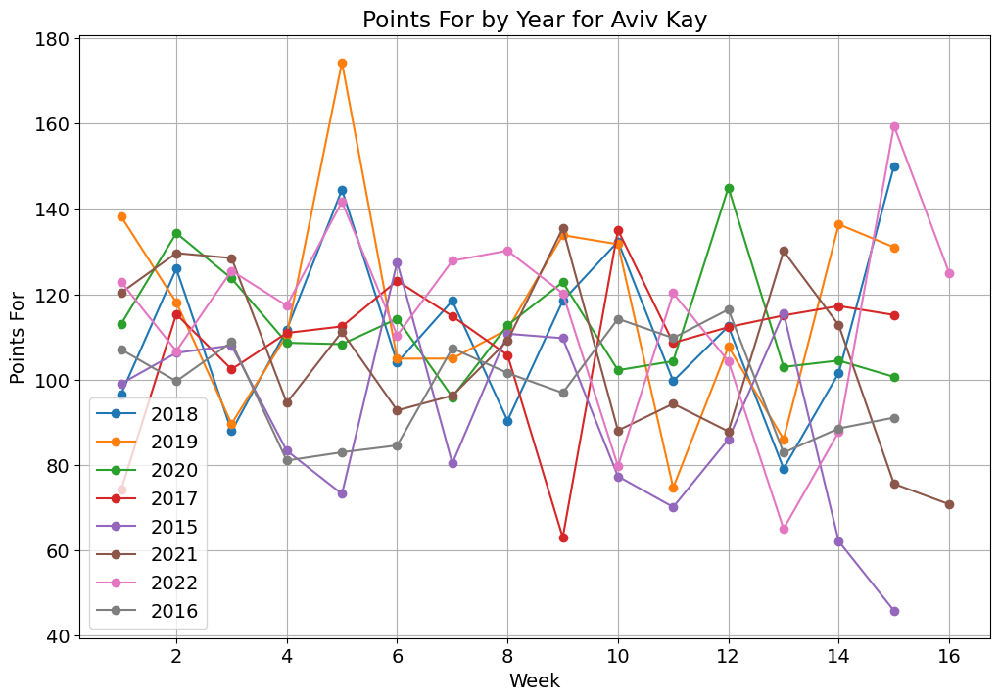

In [92]:
import matplotlib.pyplot as plt

# Increase the default font size
plt.rcParams.update({'font.size': 14})

plt.figure(figsize=(12,8))  # Increase the figure size

# Filter the data for the owner 'Aviv Kay'
data_for_owner = weekly_data[weekly_data['owner'] == 'Aviv Kay']

for year in data_for_owner['year'].unique():
    # Filter the data for the current year
    data_for_year = data_for_owner[data_for_owner['year'] == year]
    
    # Plot the data for the current year
    plt.plot(data_for_year['week'], data_for_year['real_score'], marker='o', linestyle='-', label=f'{year}')

plt.xlabel('Week')
plt.ylabel('Points For')
plt.title('Points For by Year for Aviv Kay')
plt.grid(True)  # Add a grid
plt.legend()
plt.show()

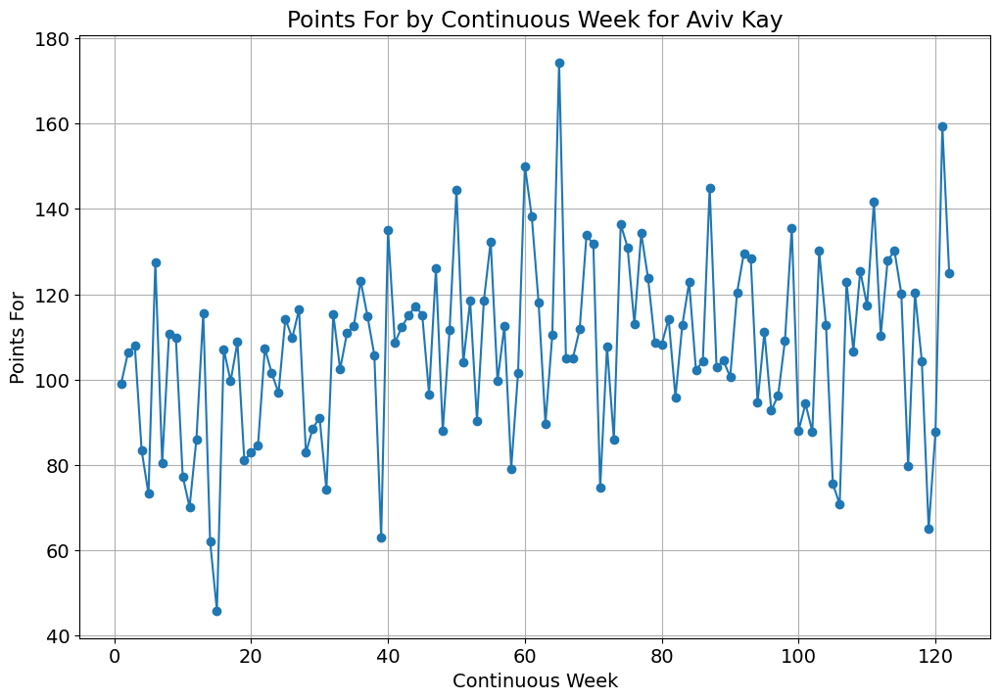

In [93]:
import matplotlib.pyplot as plt

# Increase the default font size
plt.rcParams.update({'font.size': 14})

plt.figure(figsize=(12,8))  # Increase the figure size

# Filter the data for the owner 'Aviv Kay'
data_for_owner = weekly_data[weekly_data['owner'] == 'Aviv Kay']

# Create a new column for the continuous week number
data_for_owner = data_for_owner.sort_values(by=['year', 'week'])
data_for_owner['continuous_week'] = range(1, len(data_for_owner) + 1)

# Plot the data
plt.plot(data_for_owner['continuous_week'], data_for_owner['real_score'], marker='o', linestyle='-')

plt.xlabel('Continuous Week')
plt.ylabel('Points For')
plt.title('Points For by Continuous Week for Aviv Kay')
plt.grid(True)  # Add a grid
plt.show()

In [98]:
team_owner_grouped_data = team_data.groupby('owner')
team_owner_grouped_data

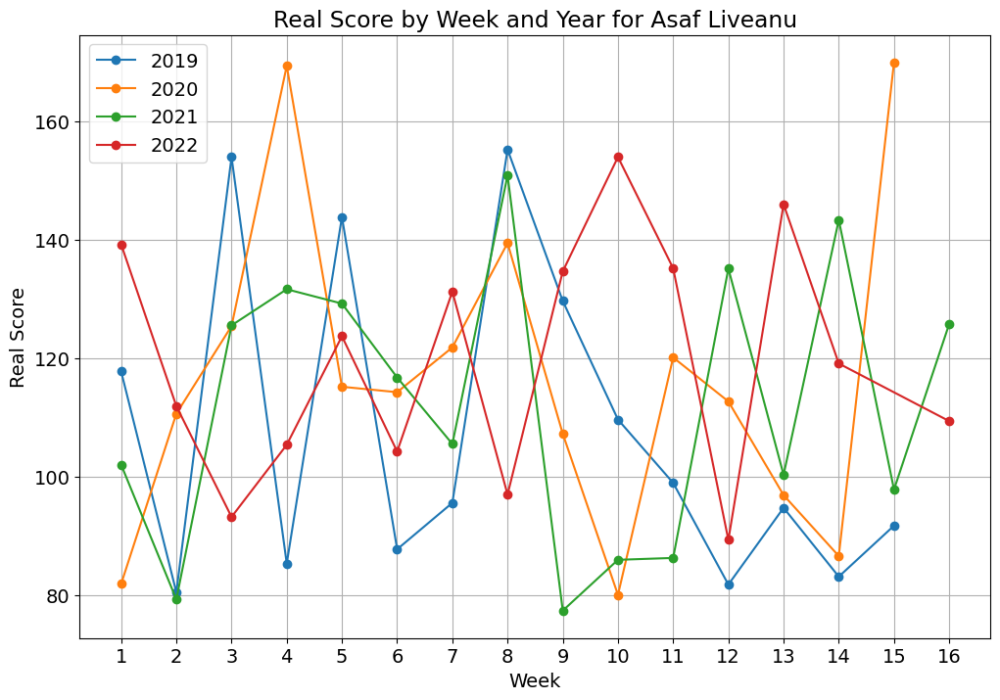

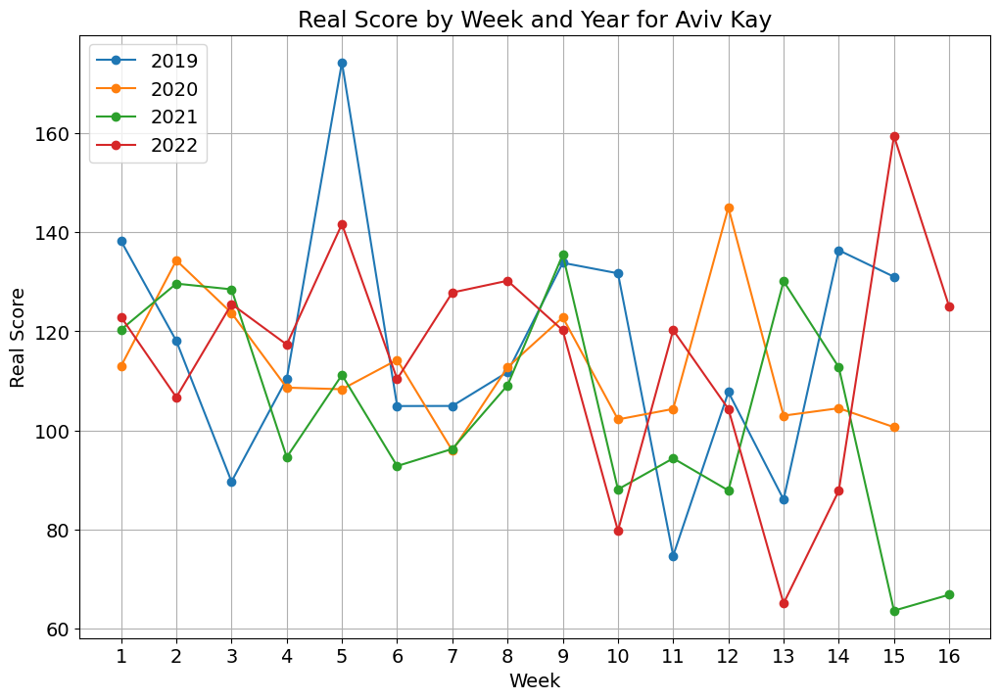

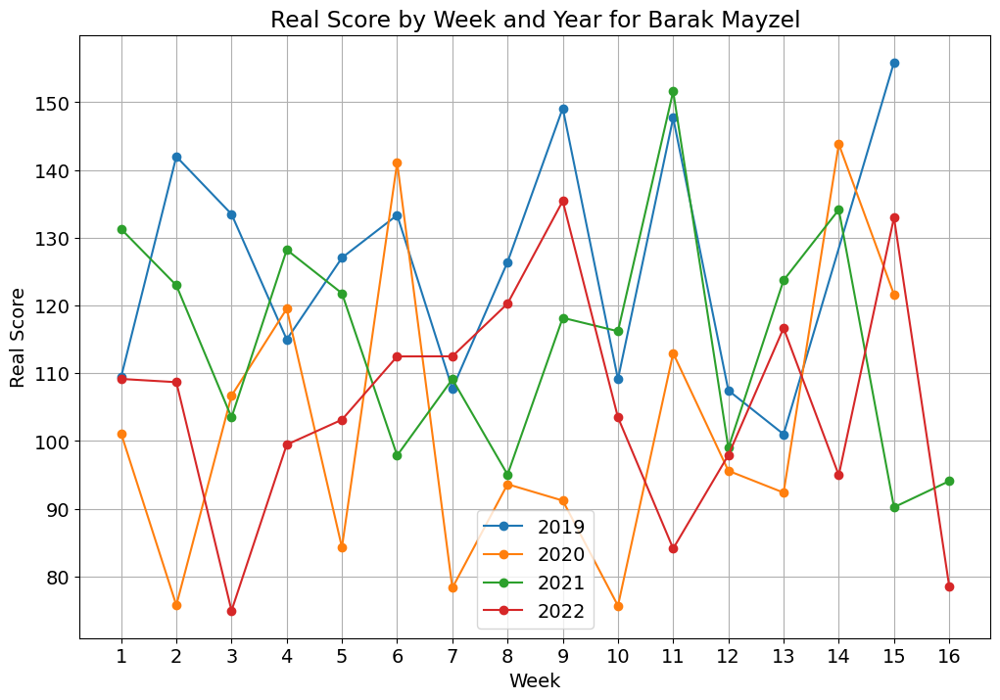

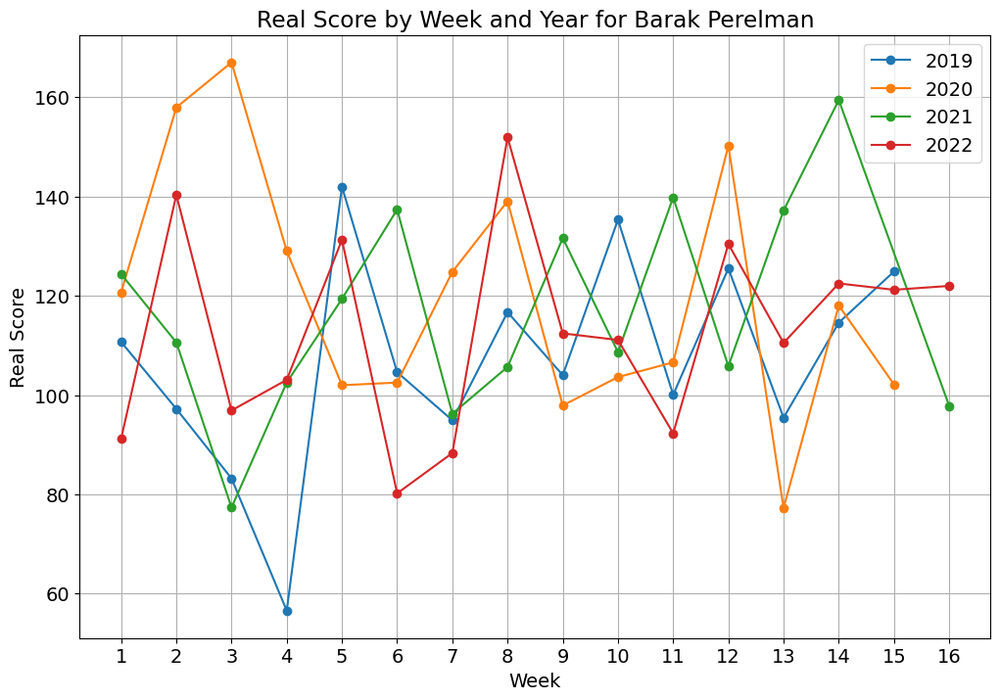

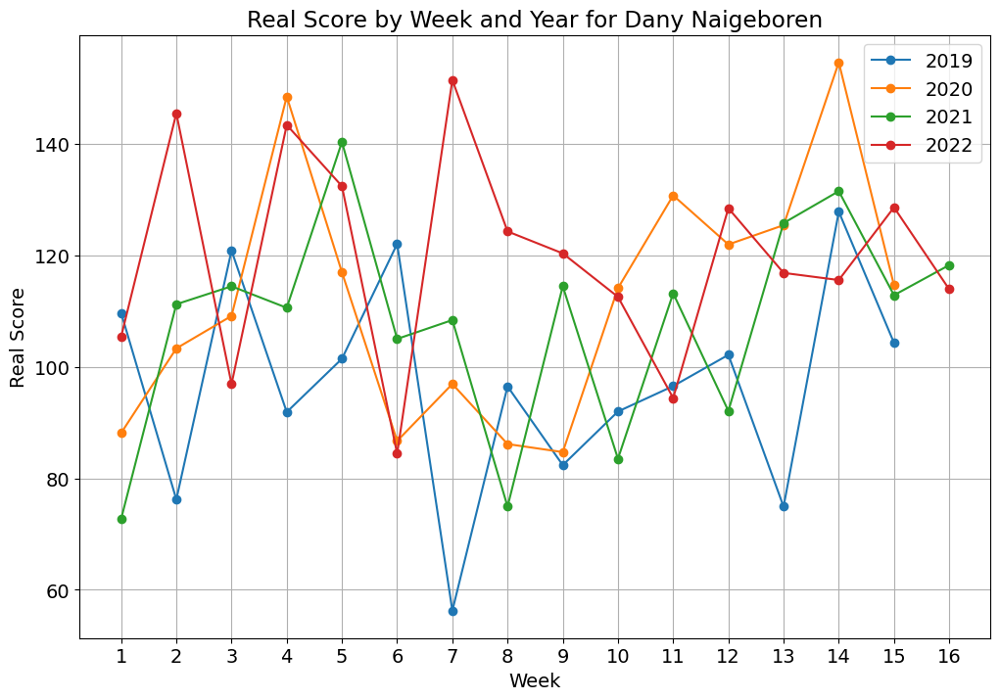

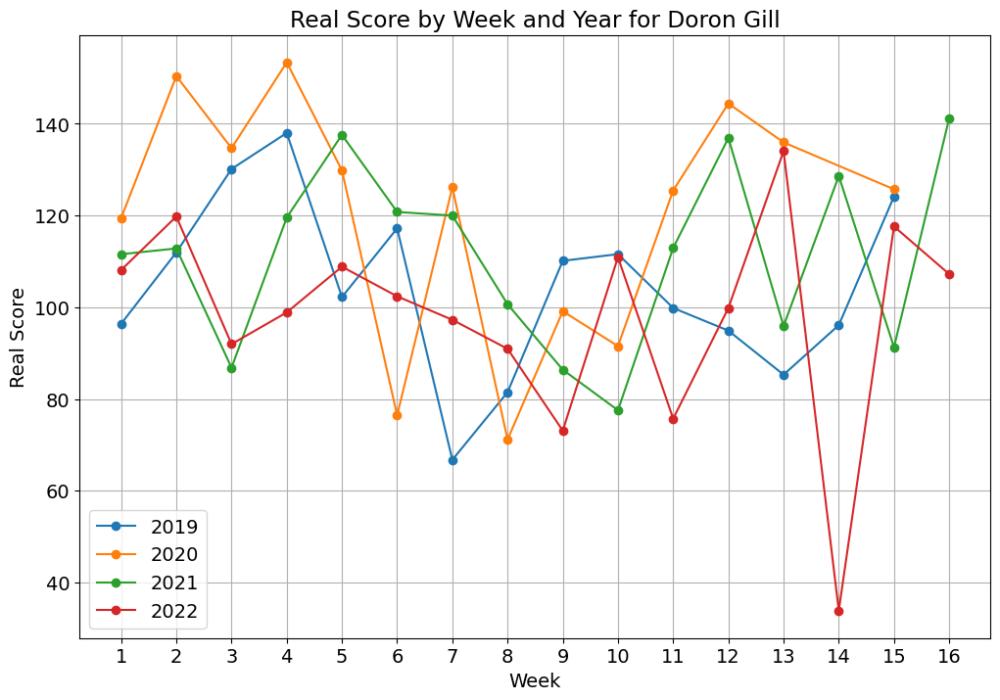

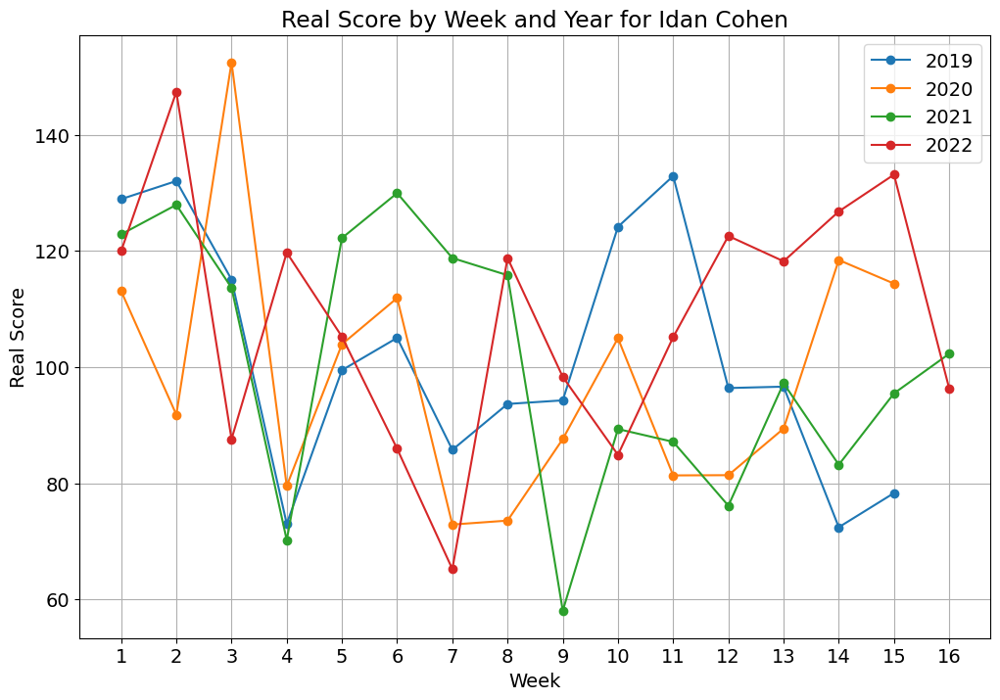

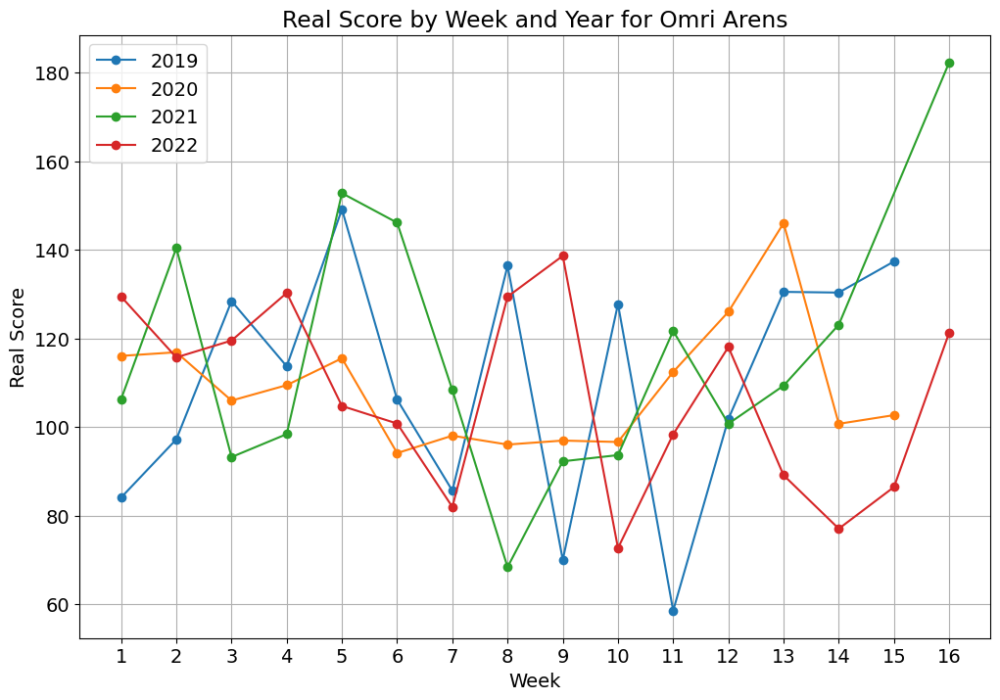

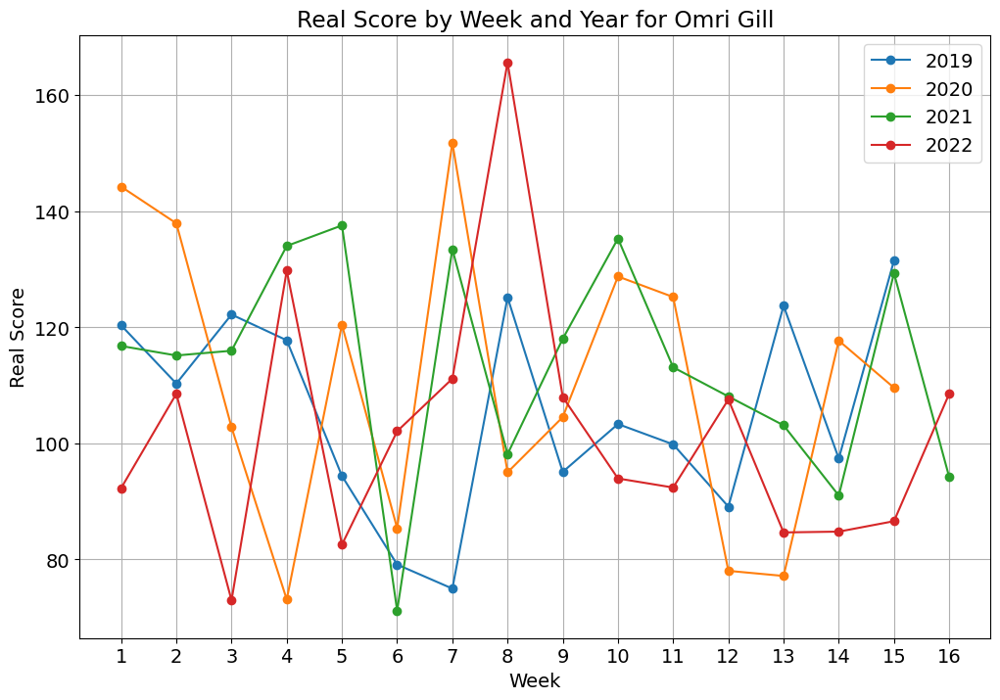

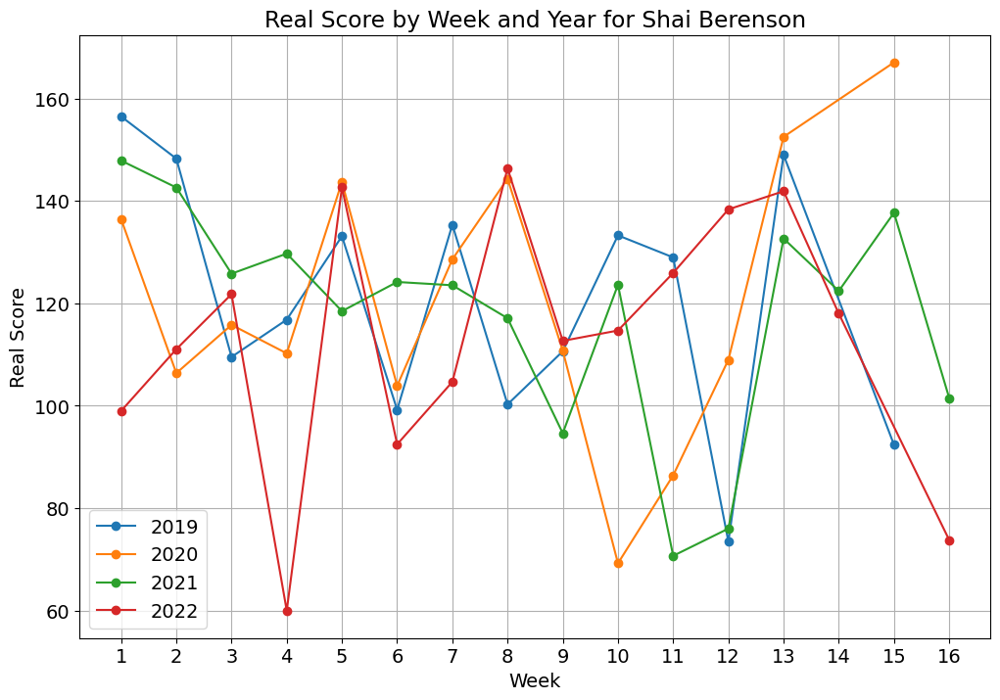

In [102]:
import matplotlib.pyplot as plt

# Increase the default font size
plt.rcParams.update({'font.size': 14})

# Assuming 'team_data' is your DataFrame, 'year' is the column containing the years, 'week' is the column containing the weeks, and 'owner' is the column containing the owners
team_owner_year_week_grouped_data = team_data.groupby(['owner', 'year', 'week'])['real_score'].mean()

for owner in team_owner_year_week_grouped_data.index.get_level_values('owner').unique():
    plt.figure(figsize=(12,8))  # Increase the figure size for each owner
    owner_data = team_owner_year_week_grouped_data.xs(owner, level='owner')
    for year in owner_data.index.get_level_values('year').unique():
        # Filter the data for the current year
        data_for_year = owner_data.xs(year, level='year')
        
        # Plot the data for the current year
        plt.plot(data_for_year.index, data_for_year.values, marker='o', linestyle='-', label=f'{year}')

    plt.xlabel('Week')
    plt.ylabel('Real Score')
    plt.title(f'Real Score by Week and Year for {owner}')
    plt.grid(True)  # Add a grid
    plt.xticks(range(1, 17))
    plt.legend()
    plt.show()

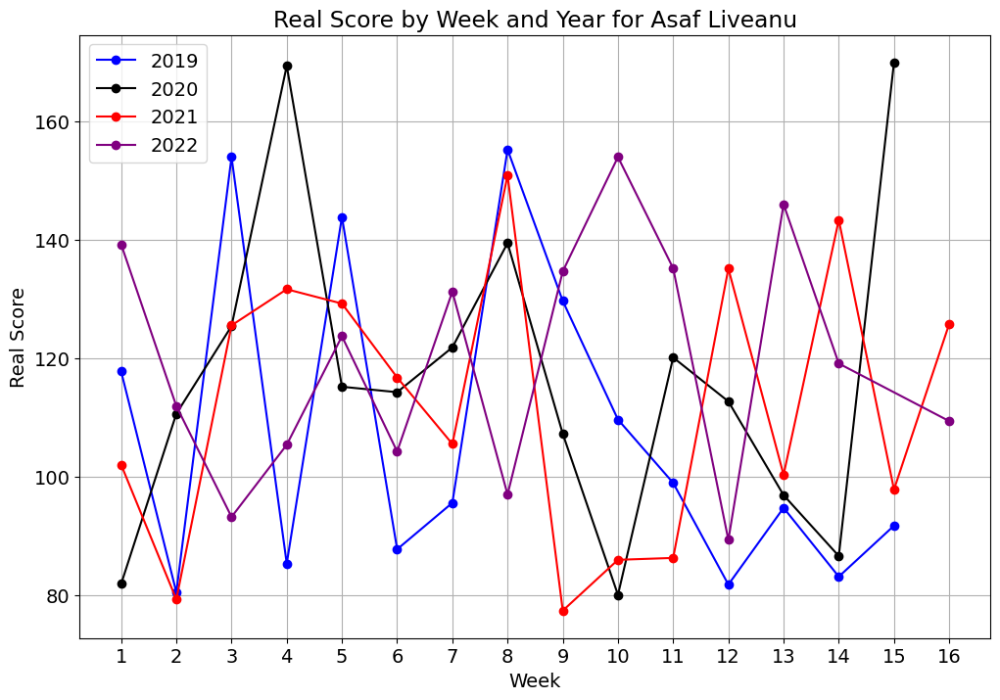

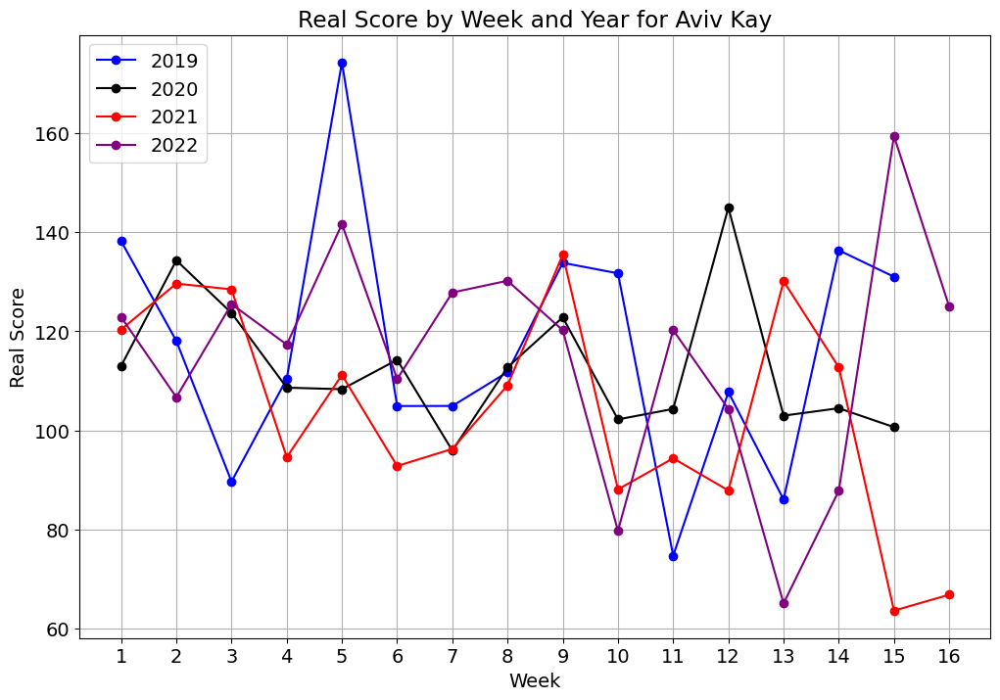

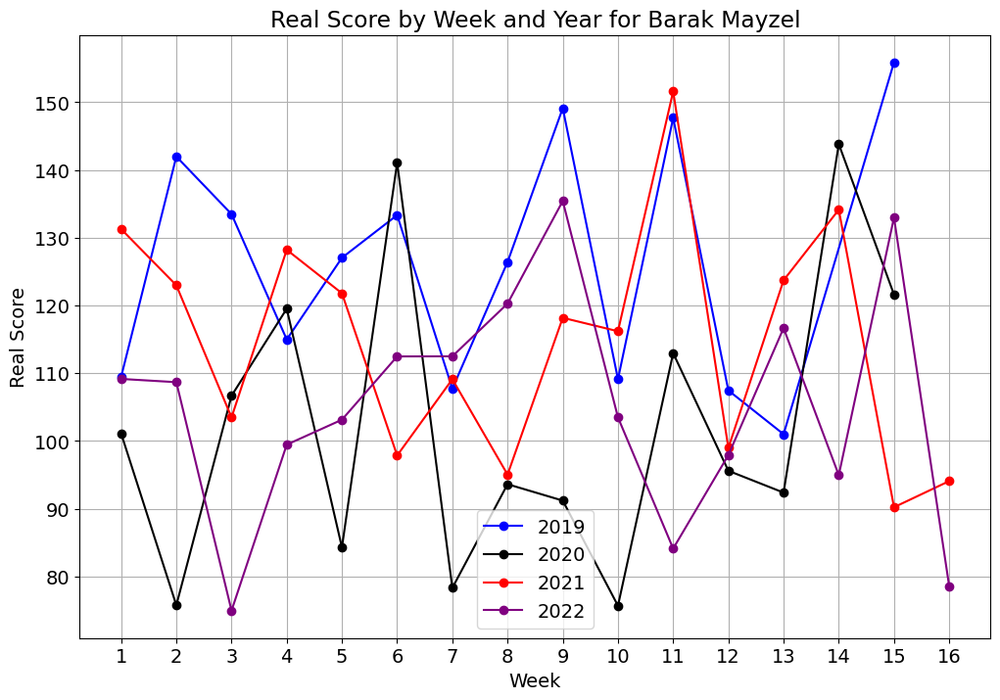

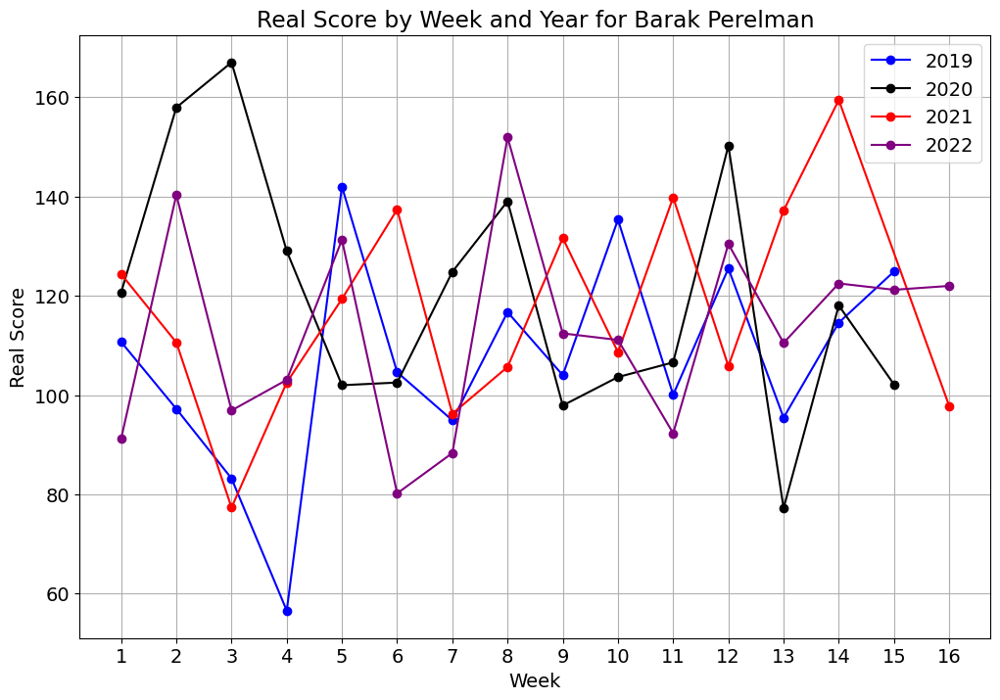

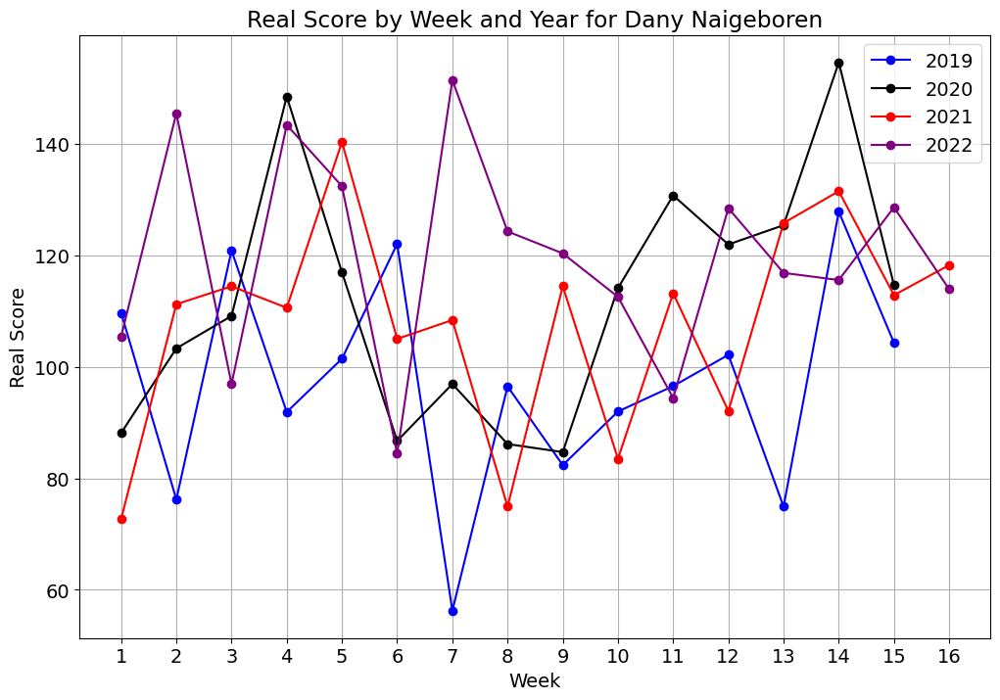

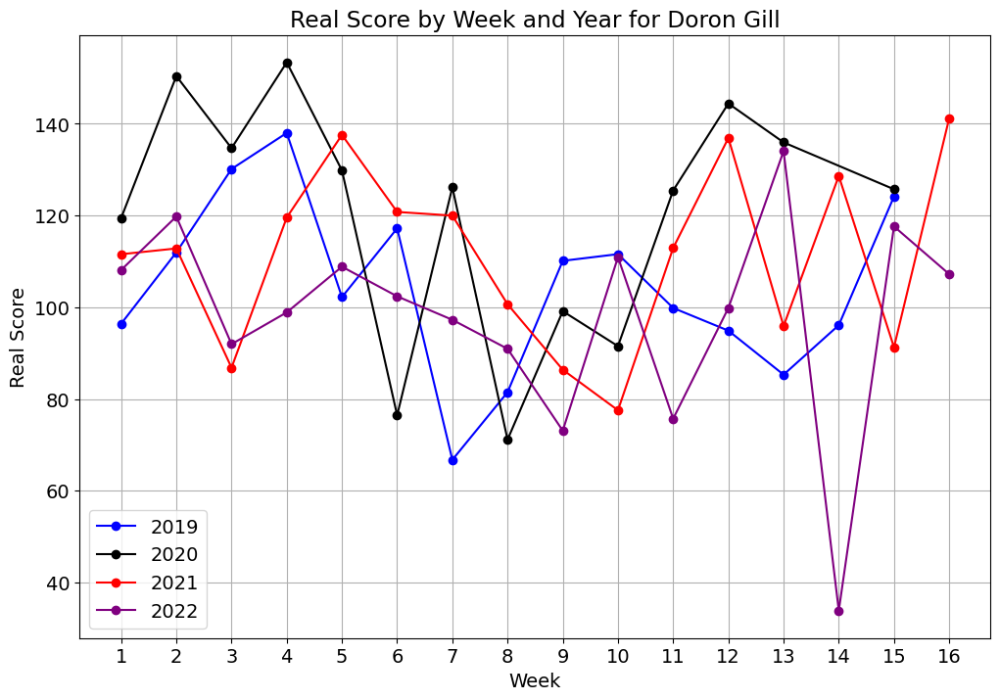

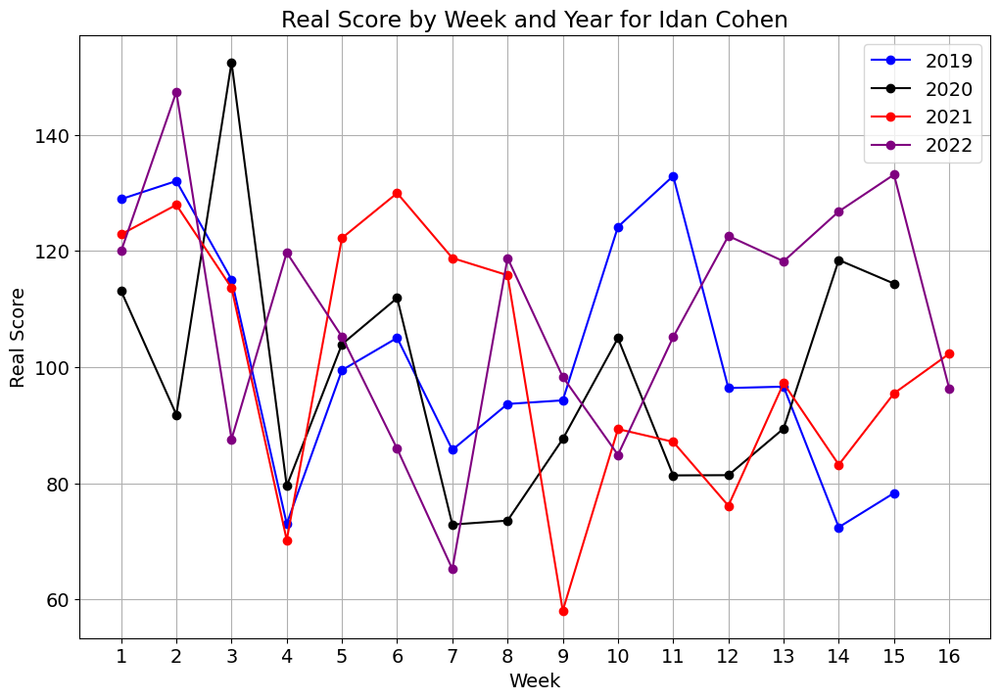

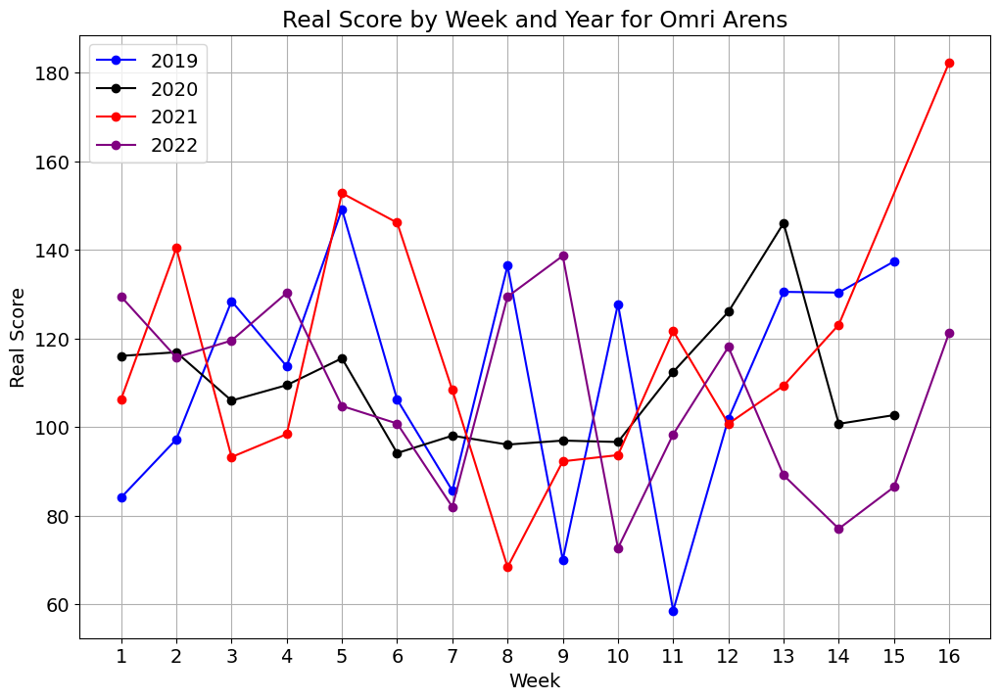

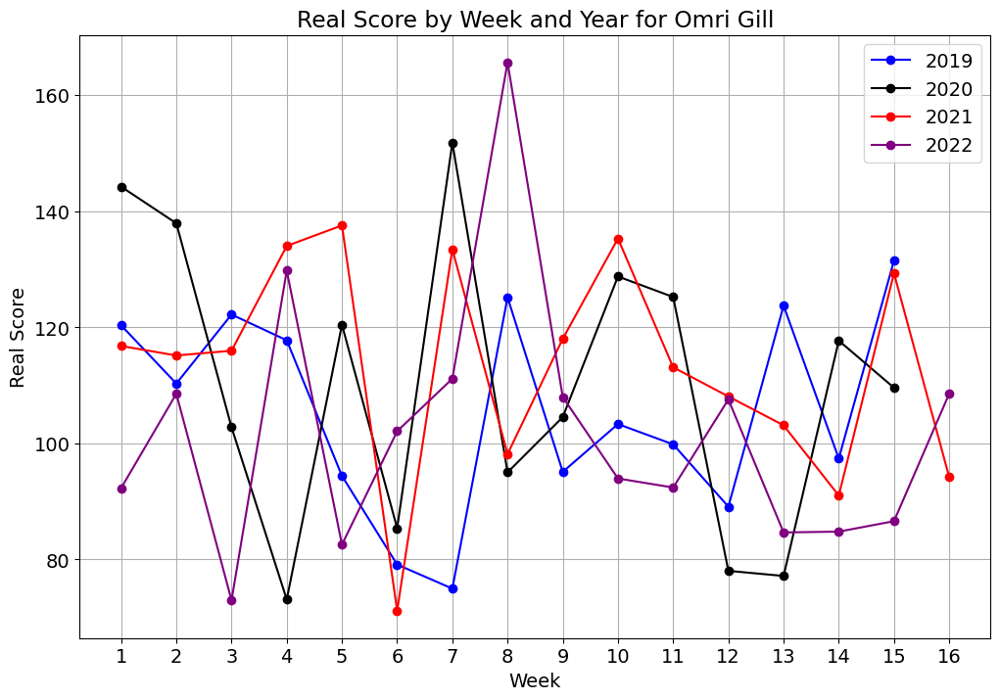

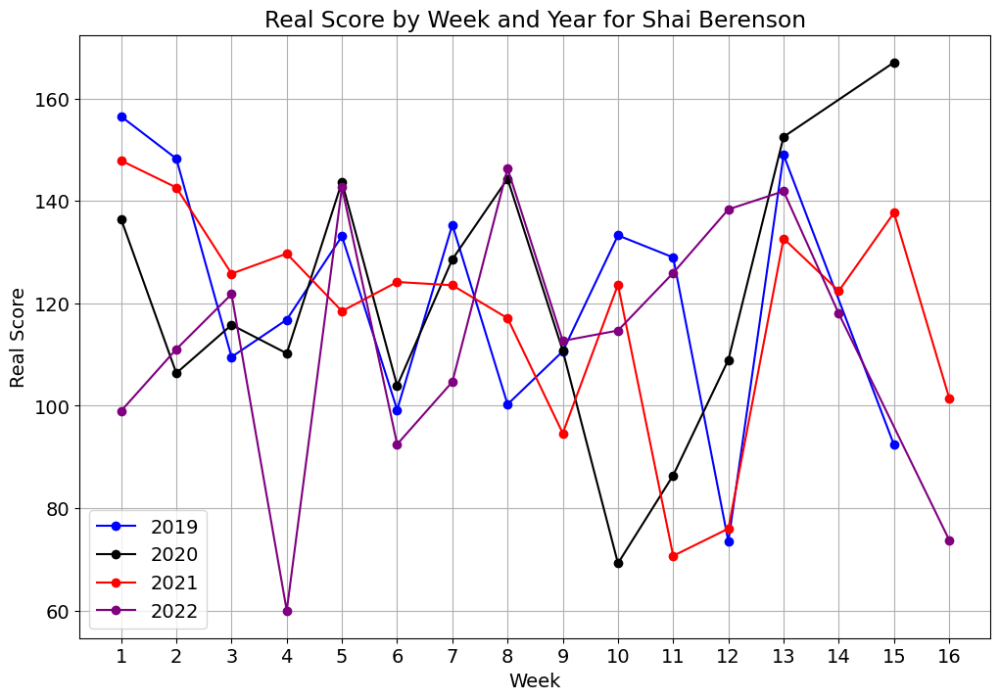

In [103]:
import matplotlib.pyplot as plt
from matplotlib import cycler

# Define a color cycle
colors = cycler('color', ['blue', 'black', 'red', 'purple', 'magenta', 'yellow', 'green'])

plt.rcParams.update({'font.size': 14, 'axes.prop_cycle': colors})

team_owner_year_week_grouped_data = team_data.groupby(['owner', 'year', 'week'])['real_score'].mean()

for owner in team_owner_year_week_grouped_data.index.get_level_values('owner').unique():
    plt.figure(figsize=(12,8))  # Increase the figure size for each owner
    owner_data = team_owner_year_week_grouped_data.xs(owner, level='owner')
    for year in owner_data.index.get_level_values('year').unique():
        # Filter the data for the current year
        data_for_year = owner_data.xs(year, level='year')
        
        # Plot the data for the current year
        plt.plot(data_for_year.index, data_for_year.values, marker='o', linestyle='-', label=f'{year}')

    plt.xlabel('Week')
    plt.ylabel('Real Score')
    plt.title(f'Real Score by Week and Year for {owner}')
    plt.grid(True)  # Add a grid
    plt.xticks(range(1, 17))  # Set x-axis ticks to show all numbers from 1 to 16
    plt.legend()
    plt.show()

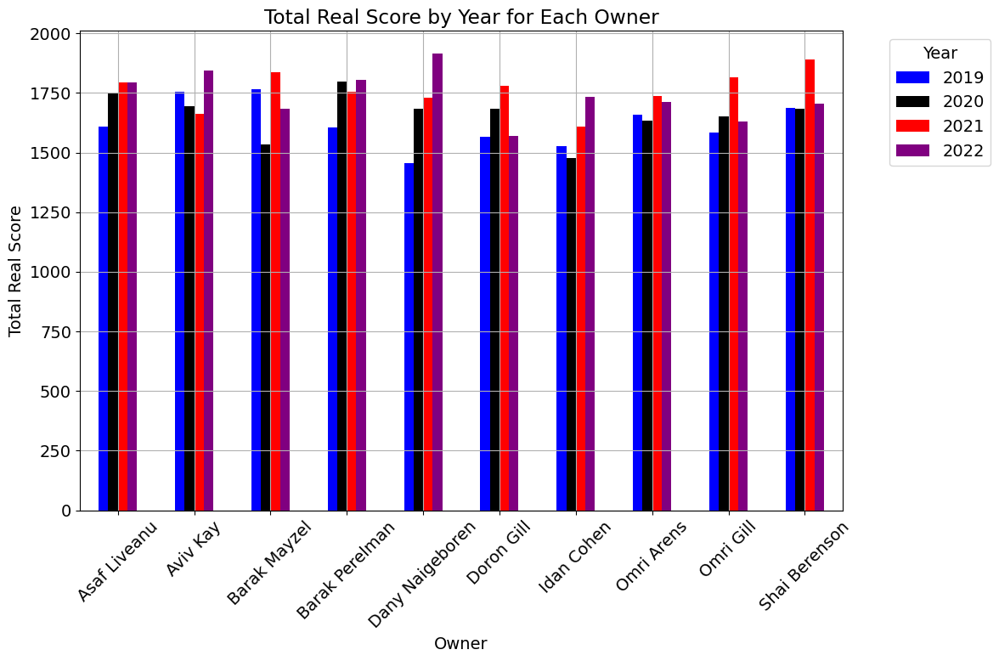

In [114]:
import matplotlib.pyplot as plt

# Assuming 'team_data' is your DataFrame, 'year' is the column containing the years, and 'owner' is the column containing the owners


team_owner_year_grouped_data = team_data.groupby(['owner', 'year'])['real_score'].sum().unstack()

team_owner_year_grouped_data.plot(kind='bar', stacked=False, figsize=(12,8))

plt.xlabel('Owner')
plt.ylabel('Total Real Score')
plt.title('Total Real Score by Year for Each Owner')
plt.grid(True)  # Add a grid
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)  # Rotate x-axis labels
plt.tight_layout()  # Adjust layout to prevent labels from being cut off
plt.show()


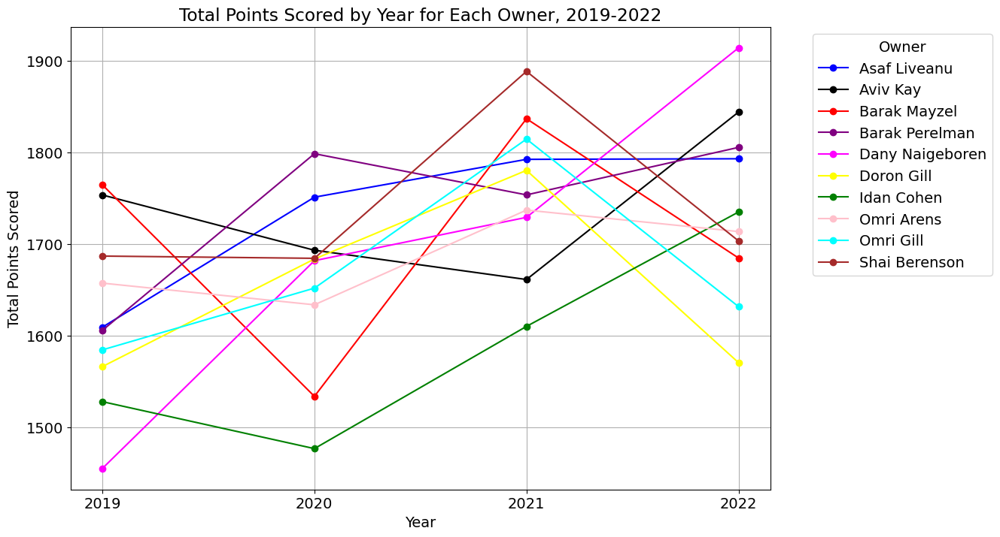

In [122]:
import matplotlib.pyplot as plt

# Assuming 'team_data' is your DataFrame, 'year' is the column containing the years, and 'owner' is the column containing the owners
colors = cycler('color', ['blue', 'black', 'red', 'purple', 'magenta', 'yellow', 'green', 'pink', 'cyan', 'brown'])

plt.rcParams.update({'font.size': 14, 'axes.prop_cycle': colors})

team_owner_year_grouped_data = team_data.groupby(['year', 'owner'])['real_score'].sum().unstack()

team_owner_year_grouped_data.plot(kind='line', marker='o', figsize=(12,8))

plt.xlabel('Year')
plt.ylabel('Total Points Scored')
plt.title('Total Points Scored by Year for Each Owner, 2019-2022')
plt.grid(True)  # Add a grid
plt.legend(title='Owner', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(team_owner_year_grouped_data.index)  # Set x-ticks to the unique years
plt.show()

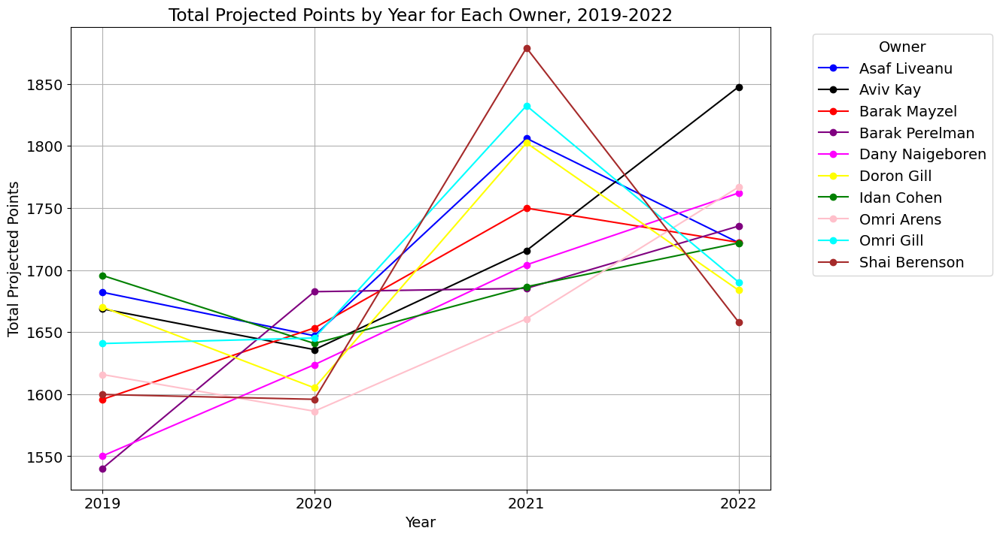

In [121]:
colors = cycler('color', ['blue', 'black', 'red', 'purple', 'magenta', 'yellow', 'green', 'pink', 'cyan', 'brown'])

plt.rcParams.update({'font.size': 14, 'axes.prop_cycle': colors})

team_owner_year_proj_grouped_data = team_data.groupby(['year', 'owner'])['proj_score'].sum().unstack()

team_owner_year_proj_grouped_data.plot(kind='line', marker='o', figsize=(12,8))

plt.xlabel('Year')
plt.ylabel('Total Projected Points')
plt.title('Total Projected Points by Year for Each Owner, 2019-2022')
plt.grid(True)  # Add a grid
plt.legend(title='Owner', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(team_owner_year_grouped_data.index)  # Set x-ticks to the unique years
plt.show()

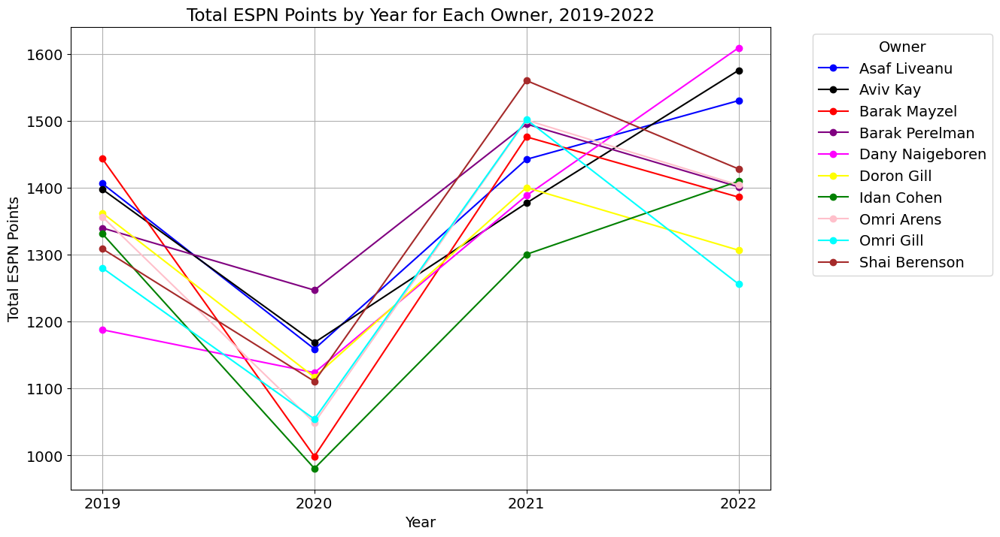

In [123]:
colors = cycler('color', ['blue', 'black', 'red', 'purple', 'magenta', 'yellow', 'green', 'pink', 'cyan', 'brown'])

plt.rcParams.update({'font.size': 14, 'axes.prop_cycle': colors})

team_owner_year_espn_grouped_data = team_data.groupby(['year', 'owner'])['espn_score'].sum().unstack()

team_owner_year_espn_grouped_data.plot(kind='line', marker='o', figsize=(12,8))

plt.xlabel('Year')
plt.ylabel('Total ESPN Points')
plt.title('Total ESPN Points by Year for Each Owner, 2019-2022')
plt.grid(True)  # Add a grid
plt.legend(title='Owner', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(team_owner_year_espn_grouped_data.index)  # Set x-ticks to the unique years
plt.show()